## 20251006 Keep only 4 indicators to check rMZR behaviors

  IC3392: HII=14884 pixels
  NGC4064: HII=6820 pixels
  NGC4192: HII=145934 pixels
  NGC4293: HII=3854 pixels
  NGC4298: HII=156350 pixels
  NGC4330: HII=42566 pixels
  NGC4383: excluded from Σ_SFR-binned analysis
  NGC4396: HII=81728 pixels
  NGC4419: HII=6886 pixels
  NGC4457: HII=6000 pixels
  NGC4501: HII=260854 pixels
  NGC4522: HII=39354 pixels
  NGC4694: HII=2585 pixels
  NGC4698: HII=10042 pixels

Total combined pixels (HII): 777857
Using uniform y-axis range: 8.0 to 9.3

Processing D16 calibration for HII regions:
  HII D16 range: 7.906 to 9.229
  Total valid bins: 14

Processing PG16 calibration for HII regions:
  HII PG16 range: 7.645 to 8.715
  Total valid bins: 14

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.202 to 8.918
  Total valid bins: 14

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.378 to 9.061
  Total valid bins: 14


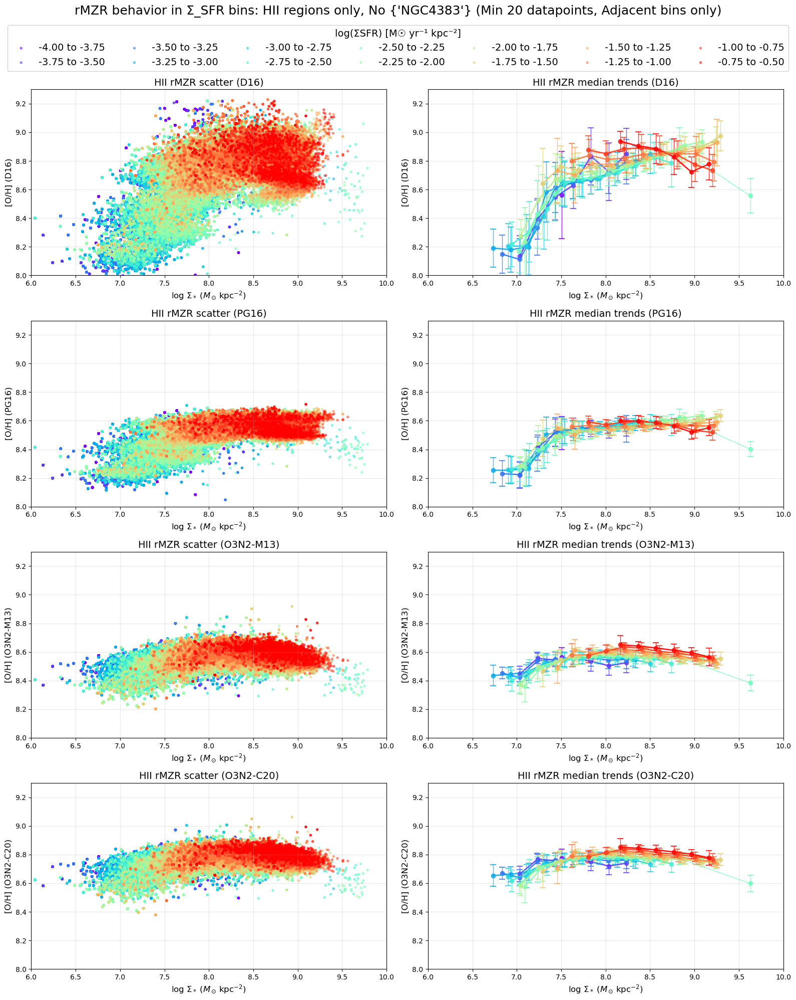


Successfully created combined 4x2 subplot figure showing HII regions from 13 galaxies
Galaxies included: IC3392, NGC4064, NGC4192, NGC4293, NGC4298, NGC4330, NGC4396, NGC4419, NGC4457, NGC4501, NGC4522, NGC4694, NGC4698
Excluded: NGC4383


In [1]:
# ------------------------------------------------------------------
# Combined Analysis: rMZR behavior in Σ_SFR bins - HII regions only
# Collect all spaxels from all galaxies
# 4 rows x 2 columns: Each row shows 1 indicator (scatter on left, median on right)
# 4 calibrations: D16, PG16, O3N2-M13, O3N2-C20
# Row 1: D16 (scatter, median)
# Row 2: PG16 (scatter, median)
# Row 3: O3N2-M13 (scatter, median)
# Row 4: O3N2-C20 (scatter, median)
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
import scipy.stats as stats

def load_maps_all_calibrations(gal):
    """Load all metallicity calibrations for HII regions"""
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # HII regions
        sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
        oh_d16_HII = h['O_H_D16_HII'].data
        oh_pg16_HII = h['O_H_PG16_HII'].data
        oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
        oh_o3n2_c20_HII = h['O_H_O3N2_C20_HII'].data
    return (sigM, sigSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, oh_o3n2_c20_HII)

def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
    """Calculate median and std in stellar mass bins - only keep bins with >= 20 unique datapoints"""
    # Define mass bins
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    mass_bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    mass_bin_centers = (mass_bin_edges[:-1] + mass_bin_edges[1:]) / 2
    
    medians = []
    stds = []
    counts = []
    valid_centers = []
    valid_bin_indices = []
    
    for i, (bin_start, bin_end) in enumerate(zip(mass_bin_edges[:-1], mass_bin_edges[1:])):
        # Select data in this mass bin
        in_mass_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_mass_bin]
        
        if len(np.unique(y_in_bin)) >= min_pixels:
            medians.append(np.median(y_in_bin))
            stds.append(np.std(y_in_bin))
            counts.append(len(y_in_bin))
            valid_centers.append(mass_bin_centers[i])
            valid_bin_indices.append(i)
    
    return (np.array(valid_centers), np.array(medians), np.array(stds), 
            np.array(counts), np.array(valid_bin_indices))

# Get all galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Galaxies to exclude entirely
excluded_galaxies = {'NGC4383'}
included_galaxies = []

# Collect all spaxels from all galaxies for HII regions
all_logSigmaM_HII = []
all_logSigmaSFR_HII = []
all_oh_d16_HII = []
all_oh_pg16_HII = []
all_oh_o3n2_m13_HII = []
all_oh_o3n2_c20_HII = []

print("Collecting data from all galaxies for HII regions...")
for gal in galaxies:
    if gal in excluded_galaxies:
        print(f"  {gal}: excluded from Σ_SFR-binned analysis")
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    if bin_file.exists() and gas_file.exists():
        included_galaxies.append(gal)
        # Load all data for HII regions
        (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
         oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

        # Find common spaxels for HII regions
        common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                           np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                           np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
        
        print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
        
        # Append HII data
        all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
        all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
        all_oh_d16_HII.extend(oh_d16_HII[common_mask_HII].flatten())
        all_oh_pg16_HII.extend(oh_pg16_HII[common_mask_HII].flatten())
        all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
        all_oh_o3n2_c20_HII.extend(oh_o3n2_c20_HII[common_mask_HII].flatten())
    else:
        print(f"  {gal}: Data files not found")

# Convert to numpy arrays
all_logSigmaM_HII = np.array(all_logSigmaM_HII)
all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
all_oh_d16_HII = np.array(all_oh_d16_HII)
all_oh_pg16_HII = np.array(all_oh_pg16_HII)
all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
all_oh_o3n2_c20_HII = np.array(all_oh_o3n2_c20_HII)

print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# Define Σ_SFR bins: -4.0 to -0.5 with 0.25 dex bin width
sfr_bin_edges = np.round(np.linspace(-4.0, -0.5, int(((-0.5) - (-4.0)) / 0.25) + 1), 2)
n_bins = len(sfr_bin_edges) - 1

# Colors for different bins
colors = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# Set uniform y-axis range
common_ylim = (8.0, 9.3)

print(f"Using uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# Create figure with 4 rows x 2 columns 
# Each row contains 1 indicator: column 0 for scatter, column 1 for median trends
fig, axes = plt.subplots(4, 2, figsize=(16, 20))

# Data for each calibration
calibrations = [
    (all_oh_d16_HII, 'D16'),
    (all_oh_pg16_HII, 'PG16'),
    (all_oh_o3n2_m13_HII, 'O3N2-M13'),
    (all_oh_o3n2_c20_HII, 'O3N2-C20')
]

# Create legend handles (will be populated during first row)
legend_handles = []
legend_labels = []

# Process each row (1 calibration per row)
for row_idx, (oh_data_HII, calib_name_HII) in enumerate(calibrations):
    print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
    
    # Column 0: Scatter plot, Column 1: Median trends
    ax_scatter = axes[row_idx, 0]
    ax_median = axes[row_idx, 1]
    
    print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")
    
    # Plot each Σ_SFR bin
    valid_bins = 0
    
    for i, (bin_start, bin_end) in enumerate(zip(sfr_bin_edges[:-1], sfr_bin_edges[1:])):
        # HII regions processing
        in_bin_HII = (all_logSigmaSFR_HII >= bin_start) & (all_logSigmaSFR_HII < bin_end)
        n_pixels_HII = np.sum(in_bin_HII)
        
        if n_pixels_HII >= 10:  # Process bins with enough pixels
            # Get data for this bin
            x_bin_HII = all_logSigmaM_HII[in_bin_HII]
            y_bin_HII = oh_data_HII[in_bin_HII]
            
            # Scatter plot
            scatter_hii = ax_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors[i]], s=15, alpha=0.6, 
                                 edgecolors='none', rasterized=True)
            
            # Collect legend info only from first row
            if row_idx == 0 and len(legend_handles) < n_bins:
                legend_handles.append(scatter_hii)
                legend_labels.append(f'{bin_start:.2f} to {bin_end:.2f}')
            
            # Median trends
            mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
                x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
            
            if len(mass_centers_HII) > 0:
                ax_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, 
                           color=colors[i], marker='o', markersize=6, 
                           linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                
                # Add lines between adjacent bins
                for j in range(len(valid_bin_indices_HII) - 1):
                    current_bin_idx = valid_bin_indices_HII[j]
                    next_bin_idx = valid_bin_indices_HII[j + 1]
                    if next_bin_idx - current_bin_idx == 1:
                        ax_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], 
                               [medians_HII[j], medians_HII[j + 1]], 
                               color=colors[i], linewidth=2, alpha=0.8)
                valid_bins += 1
    
    # Format scatter plot
    ax_scatter.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
    ax_scatter.set_title(f'HII rMZR scatter ({calib_name_HII})', fontsize=14)
    ax_scatter.grid(True, alpha=0.3)
    ax_scatter.set_xlim(6, 10)
    ax_scatter.set_ylim(common_ylim)
    
    # Format median trends plot
    ax_median.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
    ax_median.set_title(f'HII rMZR median trends ({calib_name_HII})', fontsize=14)
    ax_median.grid(True, alpha=0.3)
    ax_median.set_xlim(6, 10)
    ax_median.set_ylim(common_ylim)
    
    print(f"  Total valid bins: {valid_bins}")

# Add overall title and adjust layout
fig.suptitle(f'rMZR behavior in Σ_SFR bins: HII regions only, No {excluded_galaxies} (Min 20 datapoints, Adjacent bins only)', 
             fontsize=18, y=0.995)

# Add shared legend at the top horizontally
fig.legend(legend_handles, legend_labels, loc='upper center', bbox_to_anchor=(0.5, 0.98),
          ncol=min(len(legend_labels), 7), fontsize=14, framealpha=0.9, 
          title='log(ΣSFR) [M☉ yr⁻¹ kpc⁻²]', title_fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for suptitle and legend
# plt.savefig('Combined_rMZR_HII_only_4calibrations_4x2grid.png', dpi=300, bbox_inches='tight')
# plt.savefig('Combined_rMZR_HII_only_4calibrations_4x2grid.pdf', bbox_inches='tight')
plt.show()

print(f"\nSuccessfully created combined 4x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
print(f"Galaxies included: {', '.join(included_galaxies)}")
print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")

STEP 1: Collecting combined data from all galaxies for background...
  IC3392: HII=14884 pixels
  NGC4064: HII=6820 pixels
  NGC4192: HII=145934 pixels
  NGC4293: HII=3854 pixels
  NGC4298: HII=156350 pixels
  NGC4330: HII=42566 pixels
  NGC4383: excluded from combined dataset
  NGC4396: HII=81728 pixels
  NGC4419: HII=6886 pixels
  NGC4457: HII=6000 pixels
  NGC4501: HII=260854 pixels
  NGC4522: HII=39354 pixels
  NGC4694: HII=2585 pixels
  NGC4698: HII=10042 pixels

Total combined pixels (HII): 777857

Using uniform y-axis range: 8.0 to 9.3

STEP 2: Processing individual galaxies...

Processing galaxy: IC3392
Total HII pixels with all calibrations: 14884

Processing D16 calibration for HII regions:
  HII D16 range: 8.632 to 9.036
  Total valid bins: 7

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.462 to 8.658
  Total valid bins: 7

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.434 to 8.833
  Total valid bins: 7

Processing O3N2-C20 calib

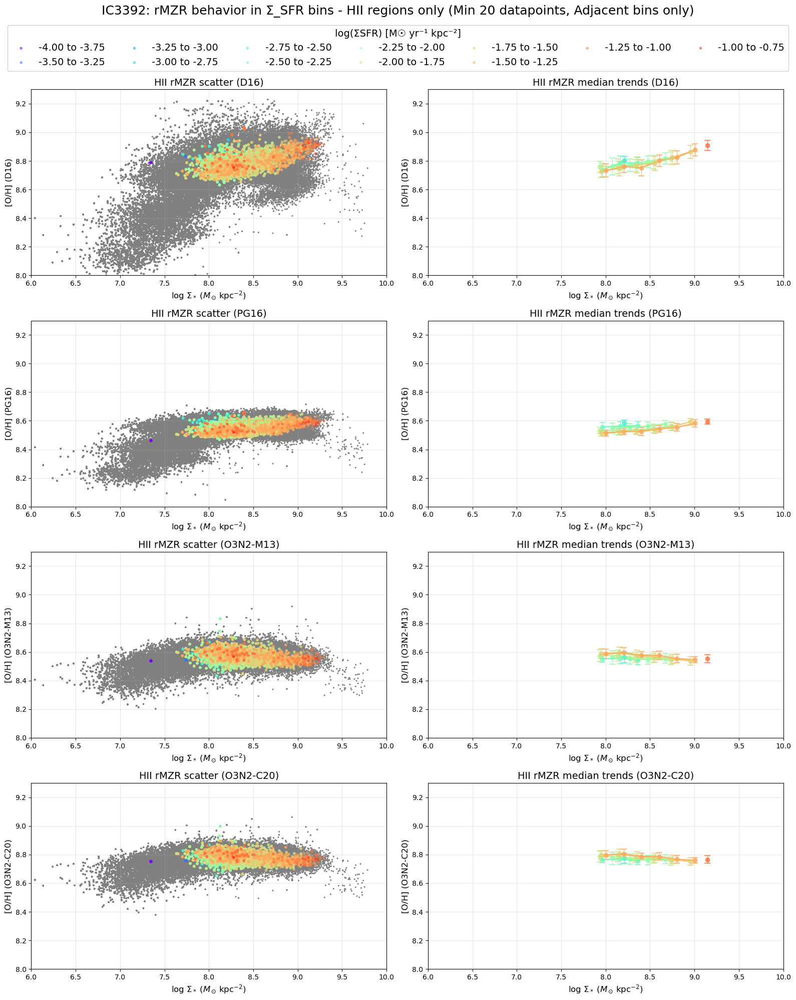


Successfully created 4x2 subplot figure for IC3392

Processing galaxy: NGC4064
Total HII pixels with all calibrations: 6820

Processing D16 calibration for HII regions:
  HII D16 range: 8.543 to 9.206
  Total valid bins: 9

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.391 to 8.657
  Total valid bins: 9

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.297 to 8.698
  Total valid bins: 9

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.500 to 8.892
  Total valid bins: 9


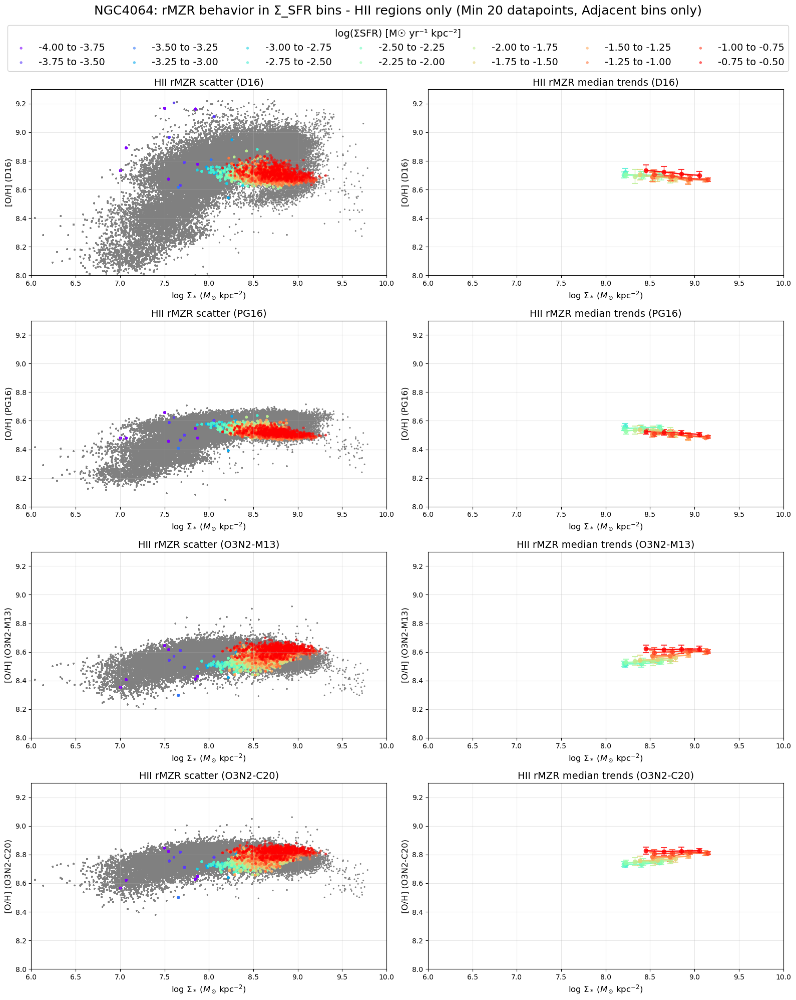


Successfully created 4x2 subplot figure for NGC4064

Processing galaxy: NGC4192
Total HII pixels with all calibrations: 145934

Processing D16 calibration for HII regions:
  HII D16 range: 8.523 to 9.222
  Total valid bins: 12

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.414 to 8.715
  Total valid bins: 12

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.398 to 8.918
  Total valid bins: 12

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.614 to 9.061
  Total valid bins: 12


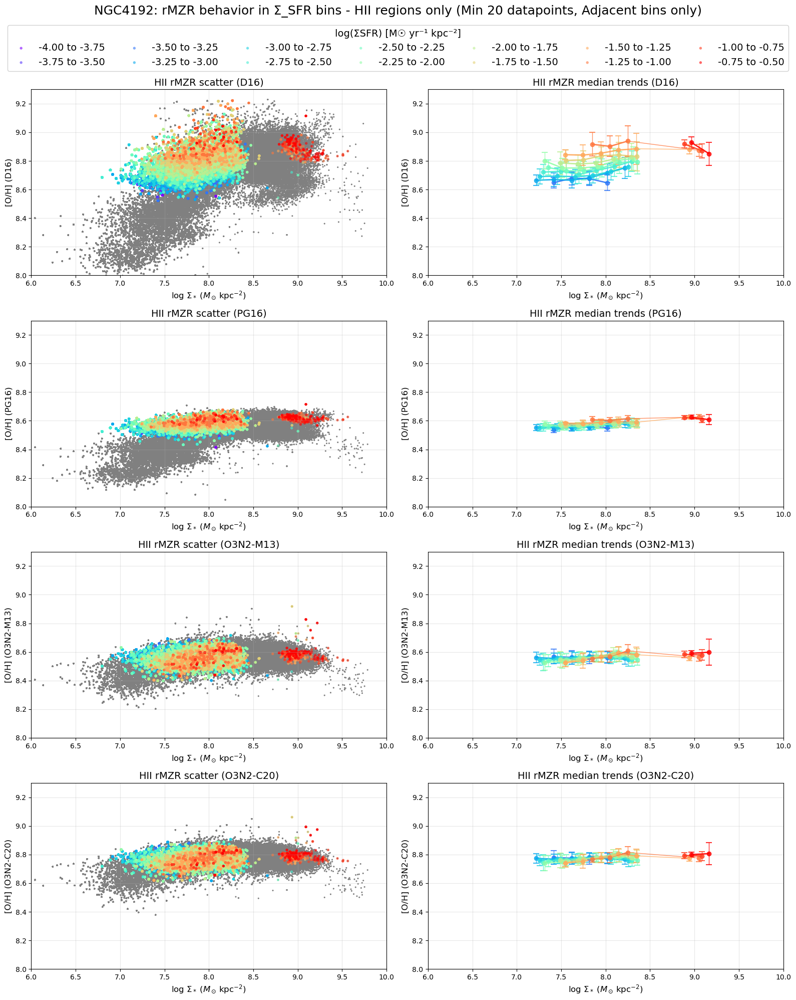


Successfully created 4x2 subplot figure for NGC4192

Processing galaxy: NGC4293
Total HII pixels with all calibrations: 3854

Processing D16 calibration for HII regions:
  HII D16 range: 7.941 to 9.218
  Total valid bins: 3

Processing PG16 calibration for HII regions:
  HII PG16 range: 7.796 to 8.707
  Total valid bins: 3

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.294 to 8.841
  Total valid bins: 3

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.496 to 9.004
  Total valid bins: 3


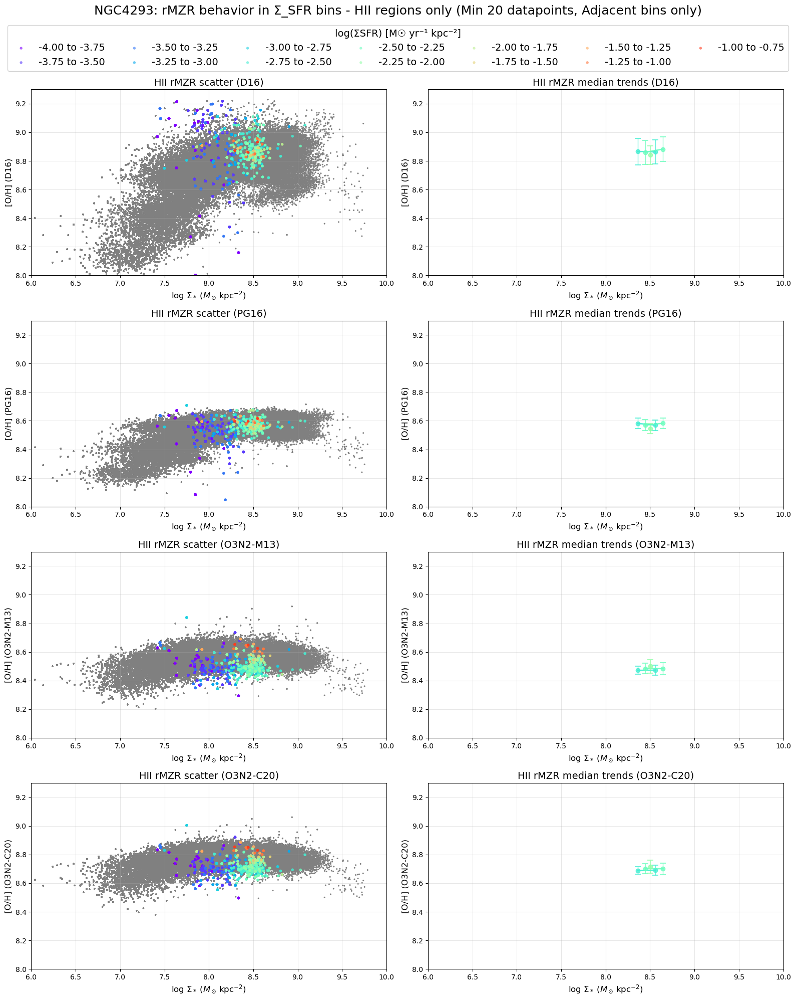


Successfully created 4x2 subplot figure for NGC4293

Processing galaxy: NGC4298
Total HII pixels with all calibrations: 156350

Processing D16 calibration for HII regions:
  HII D16 range: 8.479 to 9.030
  Total valid bins: 11

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.402 to 8.647
  Total valid bins: 11

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.394 to 8.845
  Total valid bins: 11

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.610 to 9.007
  Total valid bins: 11


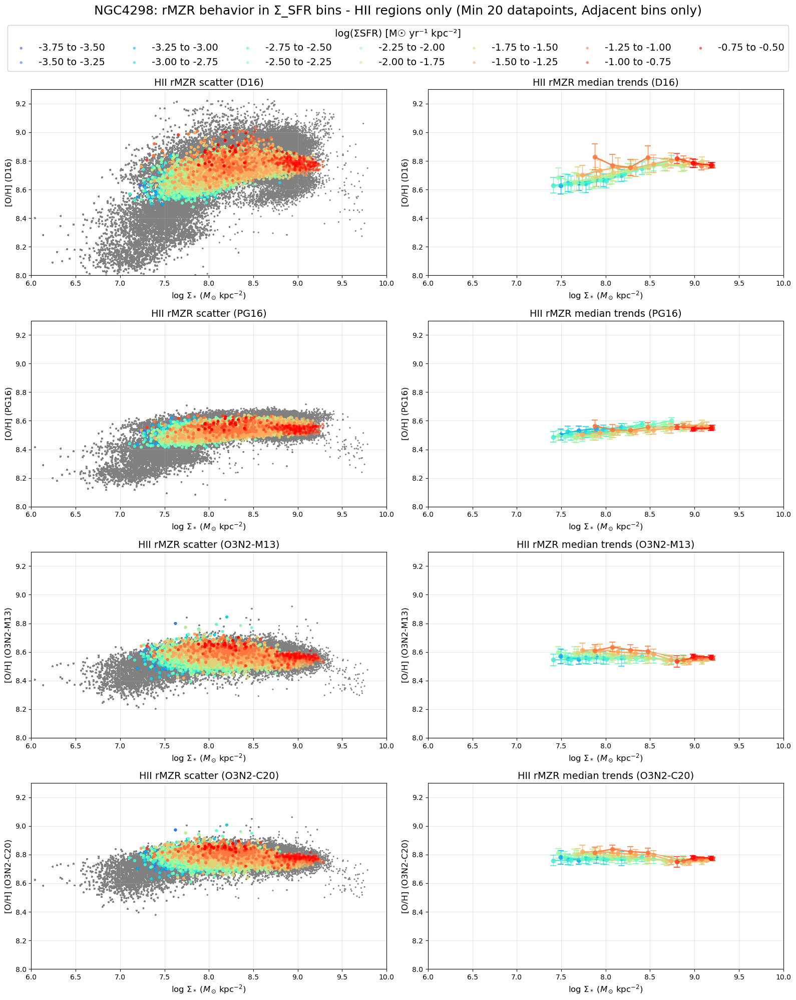


Successfully created 4x2 subplot figure for NGC4298

Processing galaxy: NGC4330
Total HII pixels with all calibrations: 42566

Processing D16 calibration for HII regions:
  HII D16 range: 8.171 to 8.887
  Total valid bins: 7

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.228 to 8.581
  Total valid bins: 7

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.300 to 8.700
  Total valid bins: 7

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.503 to 8.893
  Total valid bins: 7


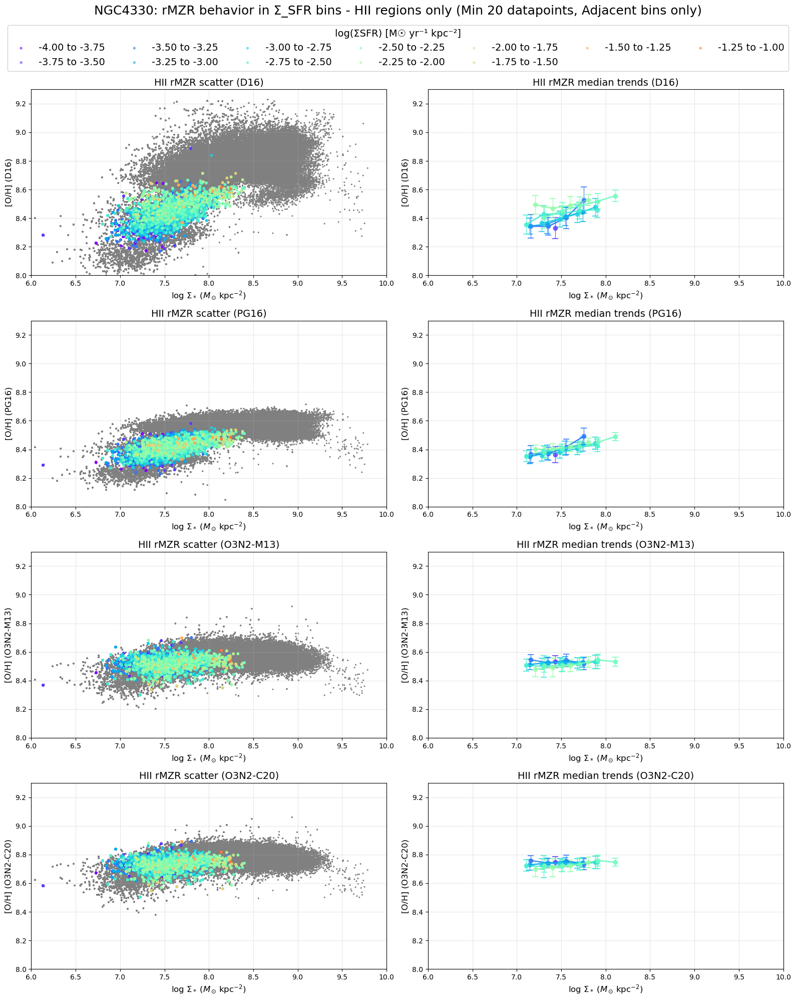


Successfully created 4x2 subplot figure for NGC4330

Skipping NGC4383 (excluded from analysis)

Processing galaxy: NGC4396
Total HII pixels with all calibrations: 81728

Processing D16 calibration for HII regions:
  HII D16 range: 7.906 to 9.099
  Total valid bins: 7

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.093 to 8.599
  Total valid bins: 7

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.202 to 8.687
  Total valid bins: 7

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.378 to 8.882
  Total valid bins: 7


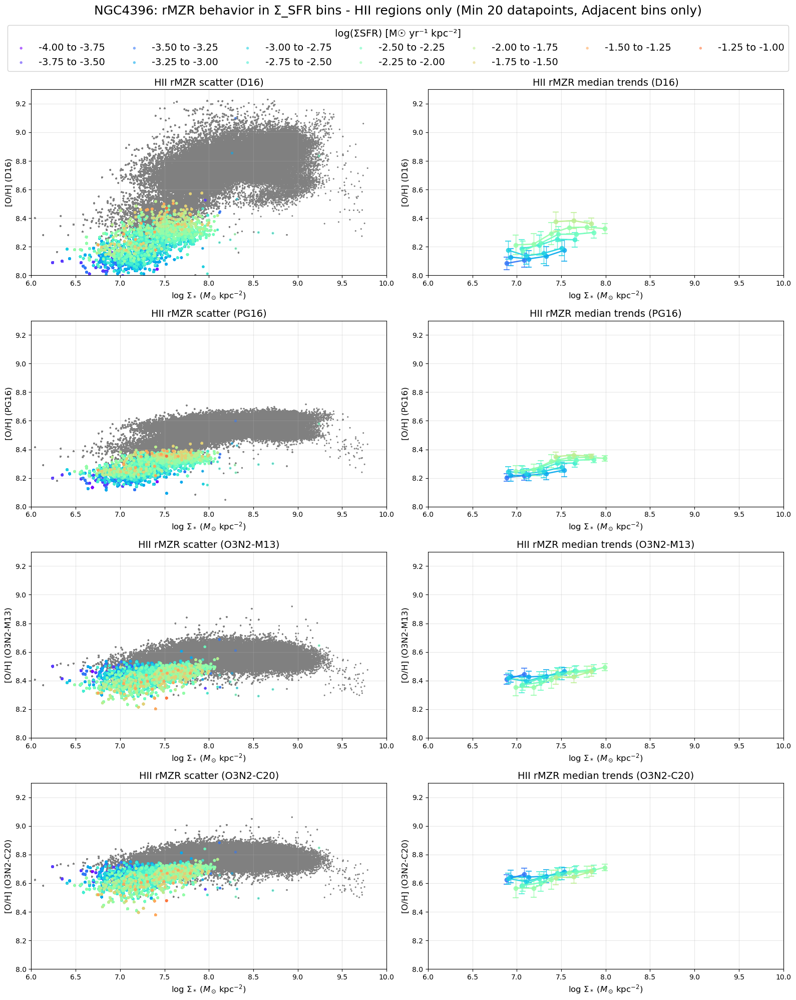


Successfully created 4x2 subplot figure for NGC4396

Processing galaxy: NGC4419
Total HII pixels with all calibrations: 6886

Processing D16 calibration for HII regions:
  HII D16 range: 8.432 to 9.130
  Total valid bins: 8

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.340 to 8.675
  Total valid bins: 8

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.300 to 8.902
  Total valid bins: 8

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.505 to 9.049
  Total valid bins: 8


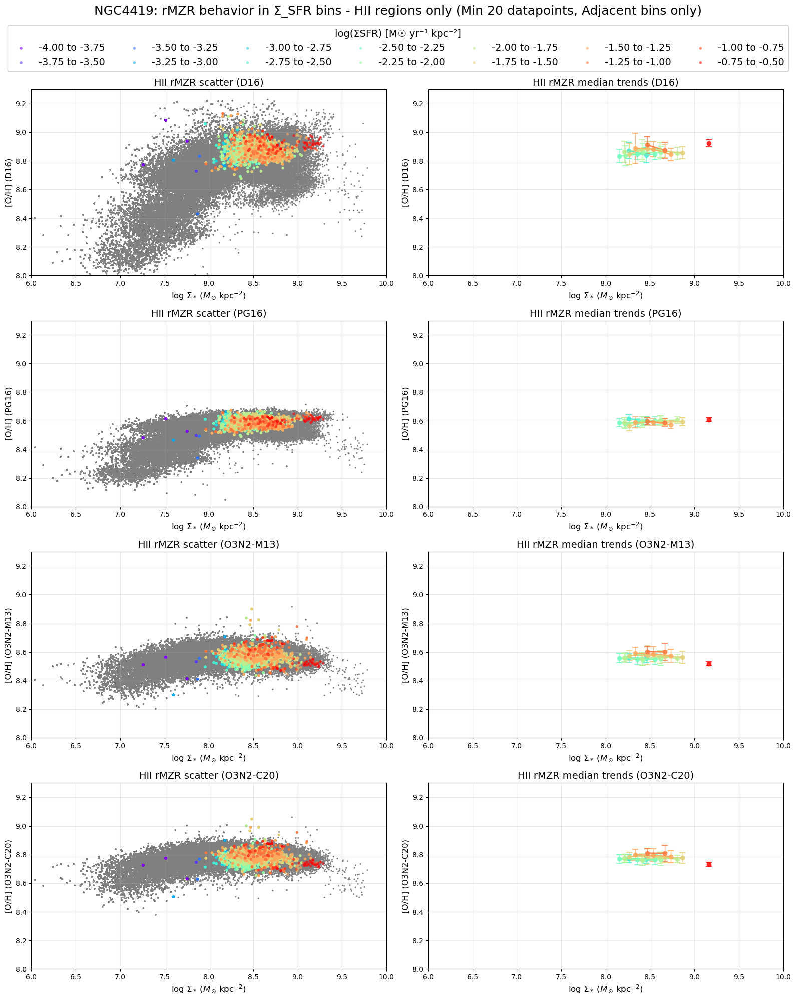


Successfully created 4x2 subplot figure for NGC4419

Processing galaxy: NGC4457
Total HII pixels with all calibrations: 6000

Processing D16 calibration for HII regions:
  HII D16 range: 8.283 to 9.096
  Total valid bins: 5

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.283 to 8.680
  Total valid bins: 5

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.342 to 8.783
  Total valid bins: 5

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.552 to 8.959
  Total valid bins: 5


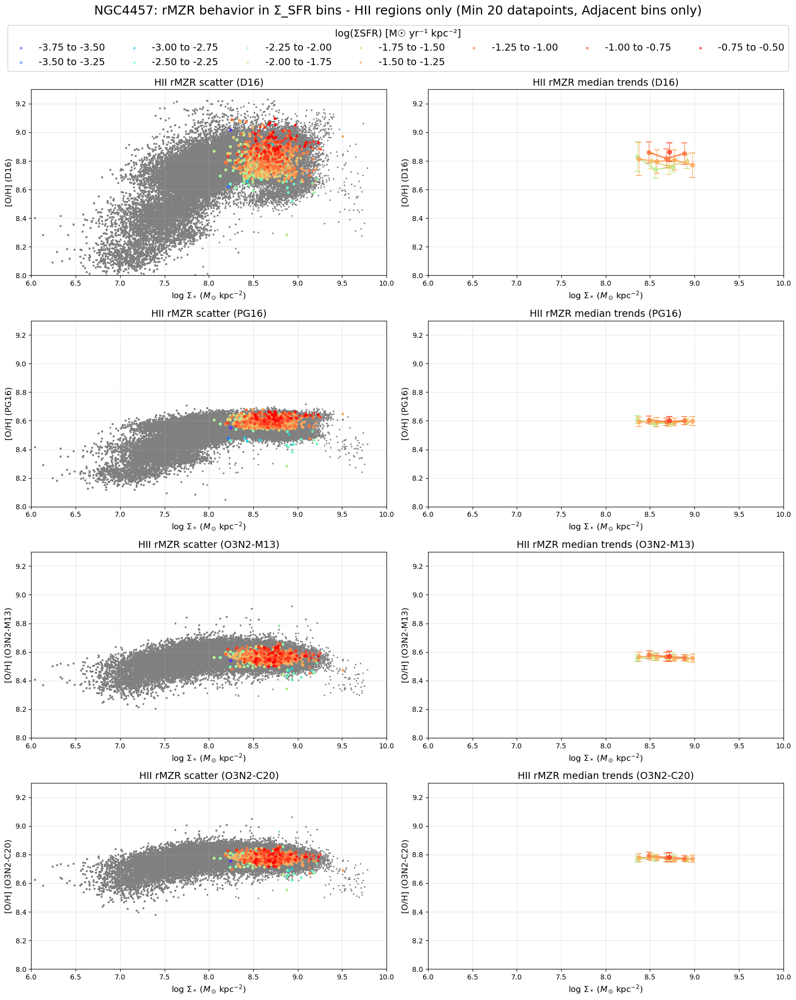


Successfully created 4x2 subplot figure for NGC4457

Processing galaxy: NGC4501
Total HII pixels with all calibrations: 260854

Processing D16 calibration for HII regions:
  HII D16 range: 8.494 to 9.229
  Total valid bins: 11

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.351 to 8.698
  Total valid bins: 11

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.391 to 8.786
  Total valid bins: 11

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.607 to 8.962
  Total valid bins: 11


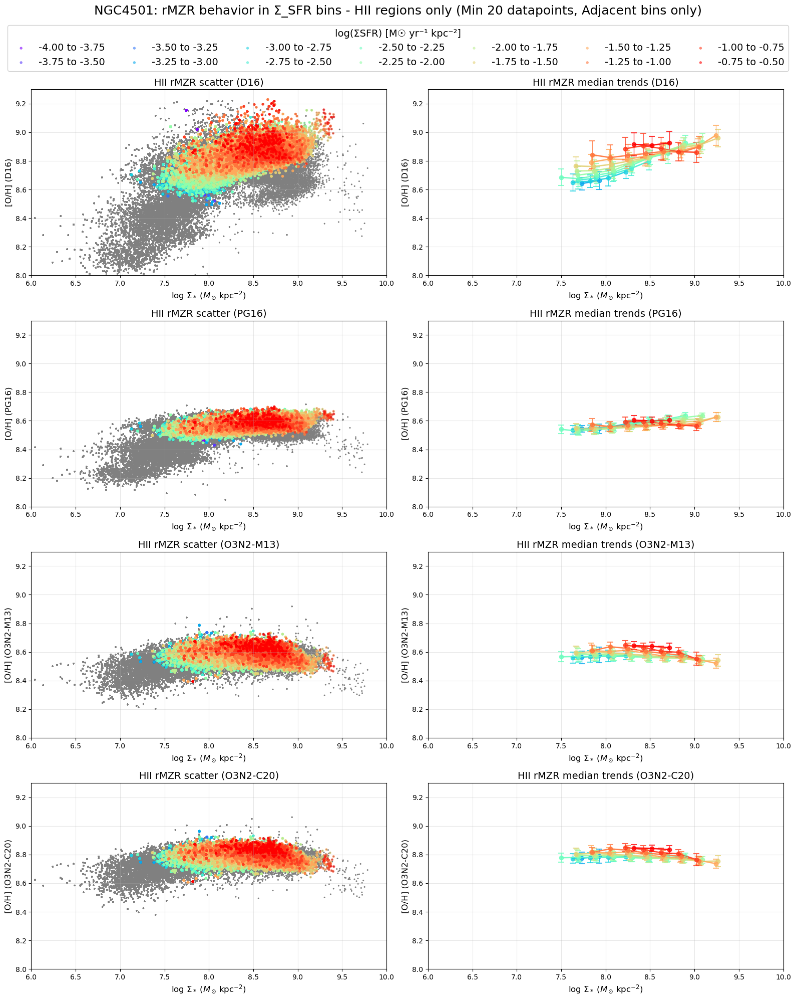


Successfully created 4x2 subplot figure for NGC4501

Processing galaxy: NGC4522
Total HII pixels with all calibrations: 39354

Processing D16 calibration for HII regions:
  HII D16 range: 8.239 to 8.927
  Total valid bins: 9

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.300 to 8.598
  Total valid bins: 9

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.361 to 8.677
  Total valid bins: 9

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.574 to 8.874
  Total valid bins: 9


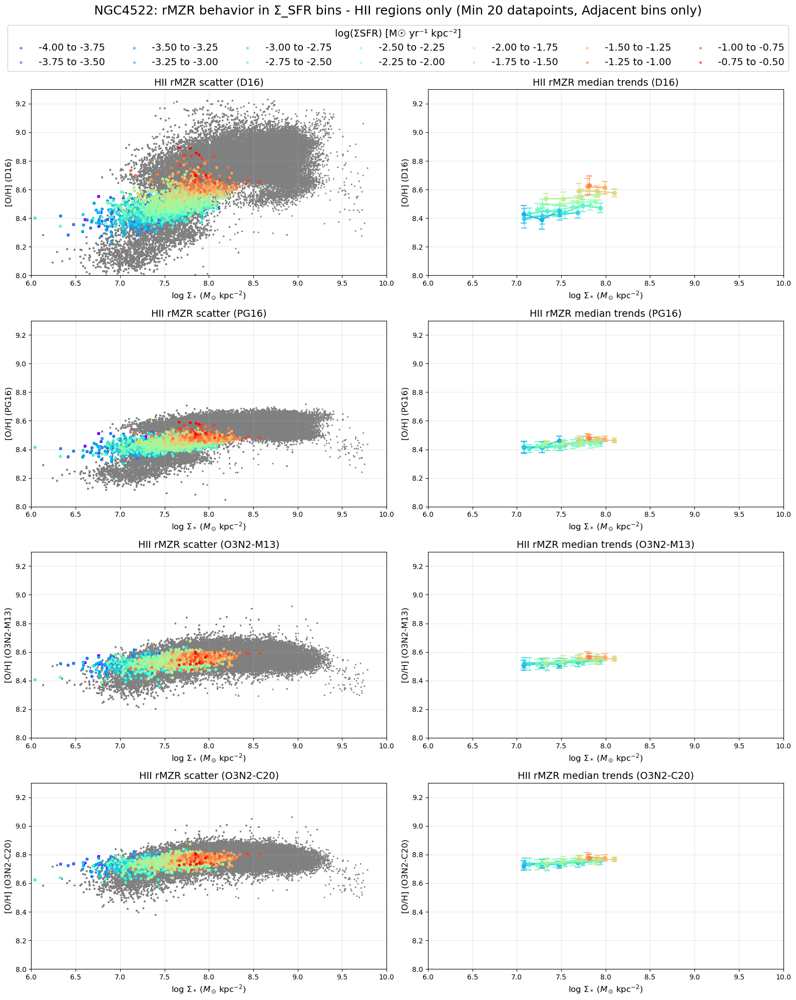


Successfully created 4x2 subplot figure for NGC4522

Processing galaxy: NGC4694
Total HII pixels with all calibrations: 2585

Processing D16 calibration for HII regions:
  HII D16 range: 8.303 to 9.119
  Total valid bins: 8

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.271 to 8.612
  Total valid bins: 8

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.381 to 8.641
  Total valid bins: 8

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.595 to 8.844
  Total valid bins: 8


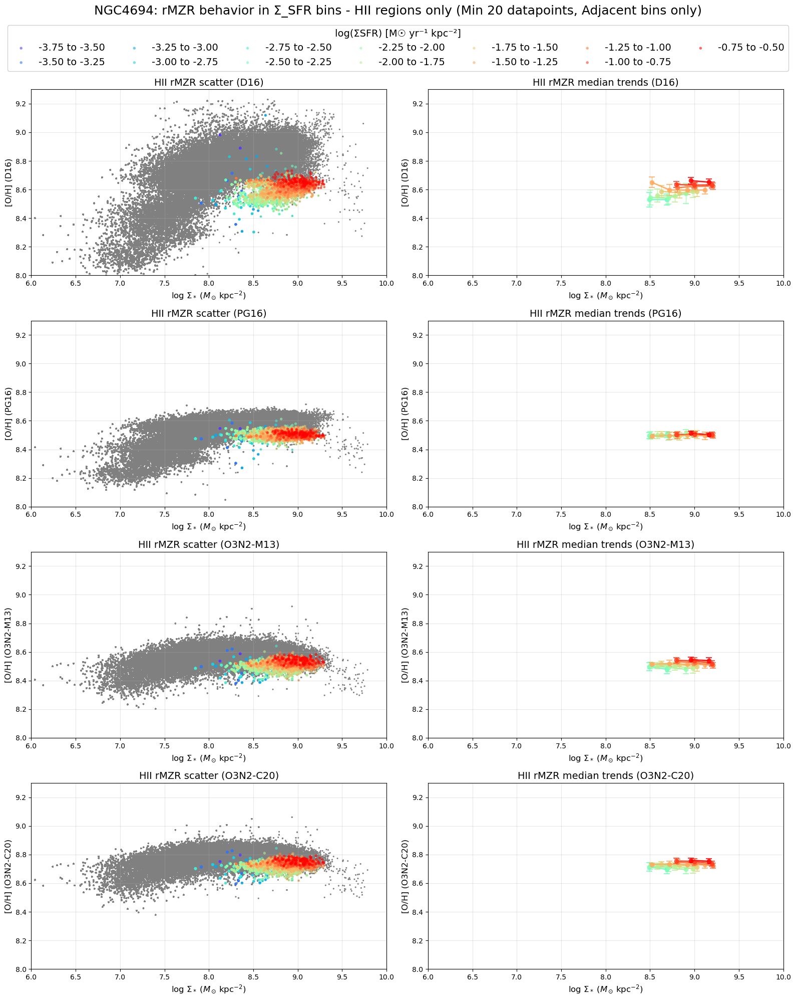


Successfully created 4x2 subplot figure for NGC4694

Processing galaxy: NGC4698
Total HII pixels with all calibrations: 10042

Processing D16 calibration for HII regions:
  HII D16 range: 8.274 to 9.219
  Total valid bins: 4

Processing PG16 calibration for HII regions:
  HII PG16 range: 7.645 to 8.689
  Total valid bins: 4

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.297 to 8.778
  Total valid bins: 4

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.500 to 8.956
  Total valid bins: 4


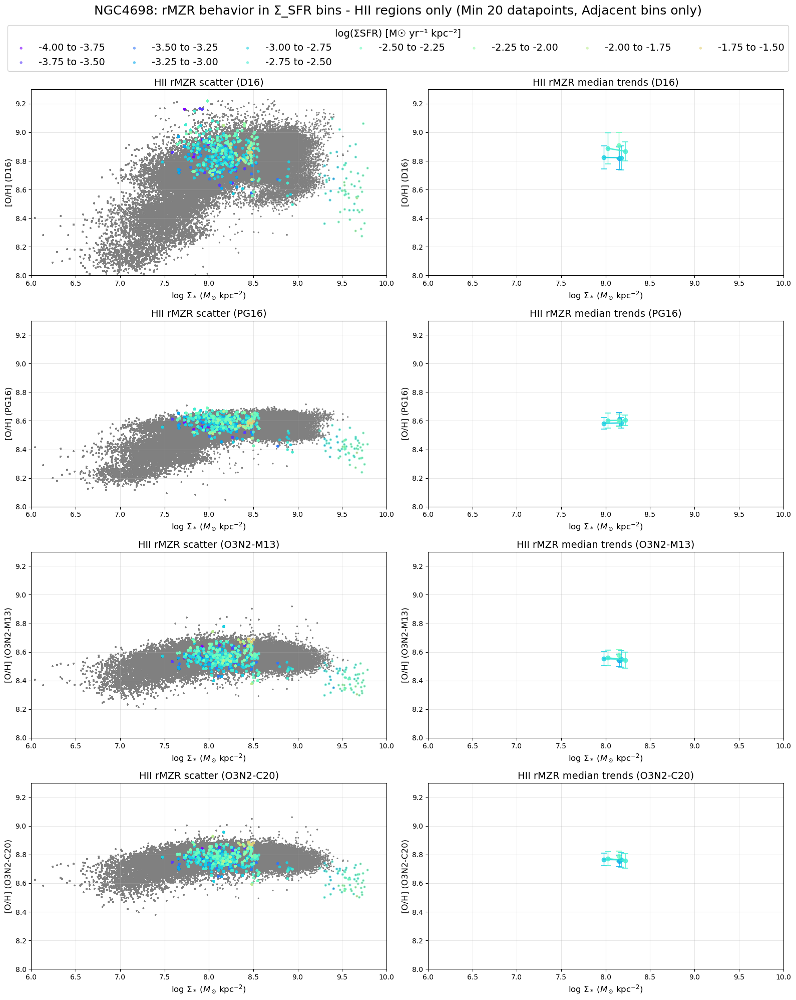


Successfully created 4x2 subplot figure for NGC4698

Finished processing all galaxies


In [2]:
# ------------------------------------------------------------------
# Individual Galaxy Analysis: rMZR behavior in Σ_SFR bins - HII regions only
# Loop through each galaxy individually
#
# 4 calibrations: D16, PG16, O3N2-M13, O3N2-C20
# Row 1: D16 (scatter left, median right)
# Row 2: PG16 (scatter left, median right)
# Row 3: O3N2-M13 (scatter left, median right)
# Row 4: O3N2-C20 (scatter left, median right)
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
import scipy.stats as stats

def load_maps_all_calibrations(gal):
    """Load all metallicity calibrations for HII regions"""
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # HII regions
        sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
        oh_d16_HII = h['O_H_D16_HII'].data
        oh_pg16_HII = h['O_H_PG16_HII'].data
        oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
        oh_o3n2_c20_HII = h['O_H_O3N2_C20_HII'].data
    return (sigM, sigSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, oh_o3n2_c20_HII)

def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
    """Calculate median and std in stellar mass bins - only keep bins with >= 20 unique datapoints"""
    # Define mass bins
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    mass_bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    mass_bin_centers = (mass_bin_edges[:-1] + mass_bin_edges[1:]) / 2
    
    medians = []
    stds = []
    counts = []
    valid_centers = []
    valid_bin_indices = []
    
    for i, (bin_start, bin_end) in enumerate(zip(mass_bin_edges[:-1], mass_bin_edges[1:])):
        # Select data in this mass bin
        in_mass_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_mass_bin]
        
        if len(np.unique(y_in_bin)) >= min_pixels:
            medians.append(np.median(y_in_bin))
            stds.append(np.std(y_in_bin))
            counts.append(len(y_in_bin))
            valid_centers.append(mass_bin_centers[i])
            valid_bin_indices.append(i)
    
    return (np.array(valid_centers), np.array(medians), np.array(stds), 
            np.array(counts), np.array(valid_bin_indices))

# Get all galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Galaxies to exclude entirely
excluded_galaxies = {'NGC4383'}
included_galaxies = []

# ==============================================================================
# First, collect combined data from all galaxies (for background gray scatter)
# ==============================================================================
print("="*80)
print("STEP 1: Collecting combined data from all galaxies for background...")
print("="*80)

all_logSigmaM_HII = []
all_logSigmaSFR_HII = []
all_oh_d16_HII = []
all_oh_pg16_HII = []
all_oh_o3n2_m13_HII = []
all_oh_o3n2_c20_HII = []

for gal in galaxies:
    if gal in excluded_galaxies:
        print(f"  {gal}: excluded from combined dataset")
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    if bin_file.exists() and gas_file.exists():
        # Load all data for HII regions
        (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
         oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

        # Find common spaxels for HII regions
        common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                           np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                           np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
        
        print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
        
        # Append HII data
        all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
        all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
        all_oh_d16_HII.extend(oh_d16_HII[common_mask_HII].flatten())
        all_oh_pg16_HII.extend(oh_pg16_HII[common_mask_HII].flatten())
        all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
        all_oh_o3n2_c20_HII.extend(oh_o3n2_c20_HII[common_mask_HII].flatten())

# Convert to numpy arrays
all_logSigmaM_HII = np.array(all_logSigmaM_HII)
all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
all_oh_d16_HII = np.array(all_oh_d16_HII)
all_oh_pg16_HII = np.array(all_oh_pg16_HII)
all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
all_oh_o3n2_c20_HII = np.array(all_oh_o3n2_c20_HII)

# Store combined data in a dictionary for easy access
combined_calib_map = {
    'oh_d16_HII': all_oh_d16_HII,
    'oh_pg16_HII': all_oh_pg16_HII,
    'oh_o3n2_m13_HII': all_oh_o3n2_m13_HII,
    'oh_o3n2_c20_HII': all_oh_o3n2_c20_HII
}

print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# ==============================================================================
# Define Σ_SFR bins and plotting parameters
# ==============================================================================
sfr_bin_edges = np.round(np.linspace(-4.0, -0.5, int(((-0.5) - (-4.0)) / 0.25) + 1), 2)
n_bins = len(sfr_bin_edges) - 1

# Colors for different bins
colors = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# Set uniform y-axis range
common_ylim = (8.0, 9.3)

print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# Data for each calibration
calibrations = [
    ('oh_d16_HII', 'D16'),
    ('oh_pg16_HII', 'PG16'),
    ('oh_o3n2_m13_HII', 'O3N2-M13'),
    ('oh_o3n2_c20_HII', 'O3N2-C20')
]

# ==============================================================================
# STEP 2: Loop through each galaxy and plot individual data + combined background
# ==============================================================================
print("\n" + "="*80)
print("STEP 2: Processing individual galaxies...")
print("="*80)

for gal in galaxies:
    if gal in excluded_galaxies:
        print(f"\n{'='*80}")
        print(f"Skipping {gal} (excluded from analysis)")
        print(f"{'='*80}")
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    if not (bin_file.exists() and gas_file.exists()):
        print(f"\n{'='*80}")
        print(f"Skipping {gal} (data files not found)")
        print(f"{'='*80}")
        continue

    print(f"\n{'='*80}")
    print(f"Processing galaxy: {gal}")
    print(f"{'='*80}")

    # Load all data for this galaxy
    (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
     oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

    # Find common spaxels for HII regions
    common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                       np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                       np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
    
    n_pixels_total = np.sum(common_mask_HII)
    print(f"Total HII pixels with all calibrations: {n_pixels_total}")
    
    if n_pixels_total == 0:
        print(f"No valid pixels for {gal}, skipping...")
        continue

    # Get flattened arrays for this galaxy
    gal_logSigmaM = logSigmaM[common_mask_HII].flatten()
    gal_logSigmaSFR_HII = logSigmaSFR_HII[common_mask_HII].flatten()
    gal_oh_d16_HII = oh_d16_HII[common_mask_HII].flatten()
    gal_oh_pg16_HII = oh_pg16_HII[common_mask_HII].flatten()
    gal_oh_o3n2_m13_HII = oh_o3n2_m13_HII[common_mask_HII].flatten()
    gal_oh_o3n2_c20_HII = oh_o3n2_c20_HII[common_mask_HII].flatten()

    # Map calibration variable names to actual data for this galaxy
    calib_data_map = {
        'oh_d16_HII': gal_oh_d16_HII,
        'oh_pg16_HII': gal_oh_pg16_HII,
        'oh_o3n2_m13_HII': gal_oh_o3n2_m13_HII,
        'oh_o3n2_c20_HII': gal_oh_o3n2_c20_HII
    }

    # Create figure with 4 rows x 2 columns 
    fig, axes = plt.subplots(4, 2, figsize=(16, 20))

    # Create legend handles (will be populated during first row)
    legend_handles = []
    legend_labels = []

    # Process each row (1 calibration per row)
    for row_idx, (calib_key, calib_name_HII) in enumerate(calibrations):
        print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
        
        # Get the data for this calibration (individual galaxy)
        oh_data_HII = calib_data_map[calib_key]
        
        # Get the combined data for this calibration (all galaxies)
        oh_combined_HII = combined_calib_map[calib_key]
        
        # Column 0: Scatter plot, Column 1: Median trends
        ax_scatter = axes[row_idx, 0]
        ax_median = axes[row_idx, 1]
        
        print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")
        
        # FIRST: Plot combined galaxy data as gray background
        ax_scatter.scatter(all_logSigmaM_HII, oh_combined_HII, 
                         c='gray', s=5, alpha=1.0, edgecolors='none', 
                         rasterized=True, label='All galaxies')
        
        # SECOND: Plot each Σ_SFR bin for this individual galaxy
        valid_bins = 0
        
        for i, (bin_start, bin_end) in enumerate(zip(sfr_bin_edges[:-1], sfr_bin_edges[1:])):
            # HII regions processing
            in_bin_HII = (gal_logSigmaSFR_HII >= bin_start) & (gal_logSigmaSFR_HII < bin_end)
            n_pixels_HII = np.sum(in_bin_HII)
            
            if n_pixels_HII >= 10:  # Process bins with enough pixels
                # Get data for this bin
                x_bin_HII = gal_logSigmaM[in_bin_HII]
                y_bin_HII = oh_data_HII[in_bin_HII]
                
                # Scatter plot (individual galaxy on top of gray background)
                scatter_hii = ax_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors[i]], s=15, alpha=0.6, 
                                     edgecolors='none', rasterized=True)
                
                # Collect legend info only from first row
                if row_idx == 0 and len(legend_handles) < n_bins:
                    legend_handles.append(scatter_hii)
                    legend_labels.append(f'{bin_start:.2f} to {bin_end:.2f}')
                
                # Median trends
                mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
                    x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
                
                if len(mass_centers_HII) > 0:
                    ax_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, 
                               color=colors[i], marker='o', markersize=6, 
                               linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                    
                    # Add lines between adjacent bins
                    for j in range(len(valid_bin_indices_HII) - 1):
                        current_bin_idx = valid_bin_indices_HII[j]
                        next_bin_idx = valid_bin_indices_HII[j + 1]
                        if next_bin_idx - current_bin_idx == 1:
                            ax_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], 
                                   [medians_HII[j], medians_HII[j + 1]], 
                                   color=colors[i], linewidth=2, alpha=0.8)
                    valid_bins += 1
        
        # Format scatter plot
        ax_scatter.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        ax_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
        ax_scatter.set_title(f'HII rMZR scatter ({calib_name_HII})', fontsize=14)
        ax_scatter.grid(True, alpha=0.3)
        ax_scatter.set_xlim(6, 10)
        ax_scatter.set_ylim(common_ylim)
        
        # Format median trends plot
        ax_median.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        ax_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
        ax_median.set_title(f'HII rMZR median trends ({calib_name_HII})', fontsize=14)
        ax_median.grid(True, alpha=0.3)
        ax_median.set_xlim(6, 10)
        ax_median.set_ylim(common_ylim)
        
        print(f"  Total valid bins: {valid_bins}")

    # Add overall title and adjust layout
    fig.suptitle(f'{gal}: rMZR behavior in Σ_SFR bins - HII regions only (Min 20 datapoints, Adjacent bins only)', 
                 fontsize=18, y=0.995)

    # Add shared legend at the top horizontally
    fig.legend(legend_handles, legend_labels, loc='upper center', bbox_to_anchor=(0.5, 0.98),
              ncol=min(len(legend_labels), 7), fontsize=14, framealpha=0.9, 
              title='log(ΣSFR) [M☉ yr⁻¹ kpc⁻²]', title_fontsize=14)

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for suptitle and legend
    # plt.savefig(f'{gal}_rMZR_HII_only_4calibrations_4x2grid.png', dpi=300, bbox_inches='tight')
    # plt.savefig(f'{gal}_rMZR_HII_only_4calibrations_4x2grid.pdf', bbox_inches='tight')
    plt.show()

    print(f"\nSuccessfully created 4x2 subplot figure for {gal}")

print(f"\n{'='*80}")
print("Finished processing all galaxies")
print(f"{'='*80}")


## 20251007 Try only 6 SFR bins

  IC3392: HII=14884 pixels
  NGC4064: HII=6820 pixels
  NGC4192: HII=145934 pixels
  NGC4293: HII=3854 pixels
  NGC4298: HII=156350 pixels
  NGC4330: HII=42566 pixels
  NGC4383: excluded from Σ_SFR-binned analysis
  NGC4396: HII=81728 pixels
  NGC4419: HII=6886 pixels
  NGC4457: HII=6000 pixels
  NGC4501: HII=260854 pixels
  NGC4522: HII=39354 pixels
  NGC4694: HII=2585 pixels
  NGC4698: HII=10042 pixels

Total combined pixels (HII): 777857

SFR bin edges (equal-count): [-4.56674754 -2.91619543 -2.5921952  -2.3362926  -2.075667   -1.76621242
  0.01896172]
  Bin 1: -4.57 to -2.92
  Bin 2: -2.92 to -2.59
  Bin 3: -2.59 to -2.34
  Bin 4: -2.34 to -2.08
  Bin 5: -2.08 to -1.77
  Bin 6: -1.77 to 0.02
  Bin 1 count: 129462
  Bin 2 count: 129797
  Bin 3 count: 129663
  Bin 4 count: 129672
  Bin 5 count: 129590
  Bin 6 count: 129673

Using uniform y-axis range: 8.0 to 9.3

Processing D16 calibration for HII regions:
  HII D16 range: 7.906 to 9.229
  Total valid bins: 6

Processing PG16 calibra

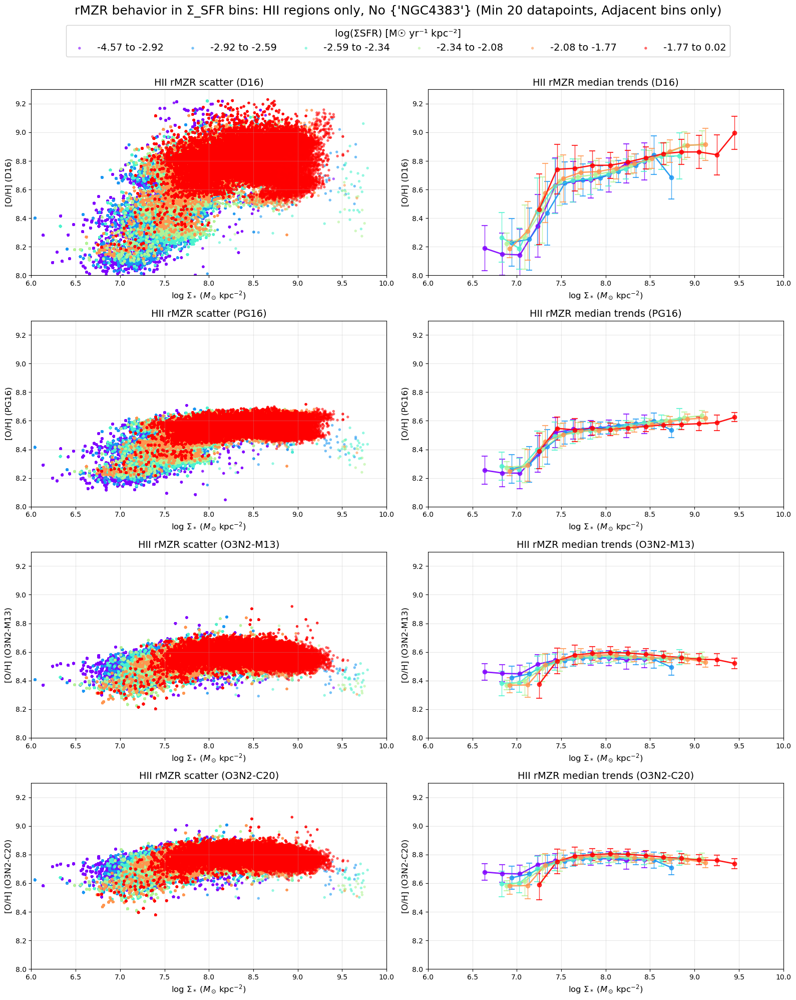


Successfully created combined 4x2 subplot figure showing HII regions from 13 galaxies
Galaxies included: IC3392, NGC4064, NGC4192, NGC4293, NGC4298, NGC4330, NGC4396, NGC4419, NGC4457, NGC4501, NGC4522, NGC4694, NGC4698
Excluded: NGC4383


In [3]:
# ------------------------------------------------------------------
# Combined Analysis: rMZR behavior in Σ_SFR bins - HII regions only
# Collect all spaxels from all galaxies
# 4 rows x 2 columns: Each row shows 1 indicator (scatter on left, median on right)
# 4 calibrations: D16, PG16, O3N2-M13, O3N2-C20
# Row 1: D16 (scatter, median)
# Row 2: PG16 (scatter, median)
# Row 3: O3N2-M13 (scatter, median)
# Row 4: O3N2-C20 (scatter, median)
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
import scipy.stats as stats

def load_maps_all_calibrations(gal):
    """Load all metallicity calibrations for HII regions"""
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # HII regions
        sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
        oh_d16_HII = h['O_H_D16_HII'].data
        oh_pg16_HII = h['O_H_PG16_HII'].data
        oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
        oh_o3n2_c20_HII = h['O_H_O3N2_C20_HII'].data
    return (sigM, sigSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, oh_o3n2_c20_HII)

def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
    """Calculate median and std in stellar mass bins - only keep bins with >= 20 unique datapoints"""
    # Define mass bins
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    mass_bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    mass_bin_centers = (mass_bin_edges[:-1] + mass_bin_edges[1:]) / 2
    
    medians = []
    stds = []
    counts = []
    valid_centers = []
    valid_bin_indices = []
    
    for i, (bin_start, bin_end) in enumerate(zip(mass_bin_edges[:-1], mass_bin_edges[1:])):
        # Select data in this mass bin
        in_mass_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_mass_bin]
        
        if len(np.unique(y_in_bin)) >= min_pixels:
            medians.append(np.median(y_in_bin))
            stds.append(np.std(y_in_bin))
            counts.append(len(y_in_bin))
            valid_centers.append(mass_bin_centers[i])
            valid_bin_indices.append(i)
    
    return (np.array(valid_centers), np.array(medians), np.array(stds), 
            np.array(counts), np.array(valid_bin_indices))

# Get all galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Galaxies to exclude entirely
excluded_galaxies = {'NGC4383'}
included_galaxies = []

# Collect all spaxels from all galaxies for HII regions
all_logSigmaM_HII = []
all_logSigmaSFR_HII = []
all_oh_d16_HII = []
all_oh_pg16_HII = []
all_oh_o3n2_m13_HII = []
all_oh_o3n2_c20_HII = []

print("Collecting data from all galaxies for HII regions...")
for gal in galaxies:
    if gal in excluded_galaxies:
        print(f"  {gal}: excluded from Σ_SFR-binned analysis")
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    if bin_file.exists() and gas_file.exists():
        included_galaxies.append(gal)
        # Load all data for HII regions
        (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
         oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

        # Find common spaxels for HII regions
        common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                           np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                           np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
        
        print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
        
        # Append HII data
        all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
        all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
        all_oh_d16_HII.extend(oh_d16_HII[common_mask_HII].flatten())
        all_oh_pg16_HII.extend(oh_pg16_HII[common_mask_HII].flatten())
        all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
        all_oh_o3n2_c20_HII.extend(oh_o3n2_c20_HII[common_mask_HII].flatten())
    else:
        print(f"  {gal}: Data files not found")

# Convert to numpy arrays
all_logSigmaM_HII = np.array(all_logSigmaM_HII)
all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
all_oh_d16_HII = np.array(all_oh_d16_HII)
all_oh_pg16_HII = np.array(all_oh_pg16_HII)
all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
all_oh_o3n2_c20_HII = np.array(all_oh_o3n2_c20_HII)

print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# Define Σ_SFR bins: 6 bins based on percentiles
n_bins = 6
percentiles = [0, 16.67, 33.33, 50, 66.67, 83.33, 100]
sfr_bin_edges = np.percentile(all_logSigmaSFR_HII, percentiles)

# Create bin labels with actual values
bin_labels = []
for i in range(n_bins):
    bin_labels.append(f'{sfr_bin_edges[i]:.2f} to {sfr_bin_edges[i+1]:.2f}')

print(f"\nSFR bin edges (equal-count): {sfr_bin_edges}")
for i, label in enumerate(bin_labels):
    print(f"  Bin {i+1}: {label}")

# Verify bin counts
for i in range(n_bins):
    if i == 0:
        mask = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i+1])
    elif i == n_bins - 1:
        mask = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII <= sfr_bin_edges[i+1])
    else:
        mask = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i+1])
    print(f"  Bin {i+1} count: {np.sum(mask)}")

# Colors for different bins
colors = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# Set uniform y-axis range
common_ylim = (8.0, 9.3)

print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# Create figure with 4 rows x 2 columns 
# Each row contains 1 indicator: column 0 for scatter, column 1 for median trends
fig, axes = plt.subplots(4, 2, figsize=(16, 20))

# Data for each calibration
calibrations = [
    (all_oh_d16_HII, 'D16'),
    (all_oh_pg16_HII, 'PG16'),
    (all_oh_o3n2_m13_HII, 'O3N2-M13'),
    (all_oh_o3n2_c20_HII, 'O3N2-C20')
]

# Create legend handles (will be populated during first row)
legend_handles = []
legend_labels = []

# Process each row (1 calibration per row)
for row_idx, (oh_data_HII, calib_name_HII) in enumerate(calibrations):
    print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
    
    # Column 0: Scatter plot, Column 1: Median trends
    ax_scatter = axes[row_idx, 0]
    ax_median = axes[row_idx, 1]
    
    print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")
    
    # Plot each Σ_SFR bin
    valid_bins = 0
    
    for i in range(n_bins):
        # HII regions processing
        if i == 0:
            in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i+1])
        elif i == n_bins - 1:
            in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII <= sfr_bin_edges[i+1])
        else:
            in_bin_HII = (all_logSigmaSFR_HII >= sfr_bin_edges[i]) & (all_logSigmaSFR_HII < sfr_bin_edges[i+1])
        
        n_pixels_HII = np.sum(in_bin_HII)
        
        if n_pixels_HII >= 10:  # Process bins with enough pixels
            # Get data for this bin
            x_bin_HII = all_logSigmaM_HII[in_bin_HII]
            y_bin_HII = oh_data_HII[in_bin_HII]
            
            # Scatter plot
            scatter_hii = ax_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors[i]], s=15, alpha=0.6, 
                                 edgecolors='none', rasterized=True)
            
            # Collect legend info only from first row
            if row_idx == 0 and len(legend_handles) < n_bins:
                legend_handles.append(scatter_hii)
                legend_labels.append(bin_labels[i])
            
            # Median trends
            mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
                x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
            
            if len(mass_centers_HII) > 0:
                ax_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, 
                           color=colors[i], marker='o', markersize=6, 
                           linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                
                # Add lines between adjacent bins
                for j in range(len(valid_bin_indices_HII) - 1):
                    current_bin_idx = valid_bin_indices_HII[j]
                    next_bin_idx = valid_bin_indices_HII[j + 1]
                    if next_bin_idx - current_bin_idx == 1:
                        ax_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], 
                               [medians_HII[j], medians_HII[j + 1]], 
                               color=colors[i], linewidth=2, alpha=0.8)
                valid_bins += 1
    
    # Format scatter plot
    ax_scatter.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
    ax_scatter.set_title(f'HII rMZR scatter ({calib_name_HII})', fontsize=14)
    ax_scatter.grid(True, alpha=0.3)
    ax_scatter.set_xlim(6, 10)
    ax_scatter.set_ylim(common_ylim)
    
    # Format median trends plot
    ax_median.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
    ax_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
    ax_median.set_title(f'HII rMZR median trends ({calib_name_HII})', fontsize=14)
    ax_median.grid(True, alpha=0.3)
    ax_median.set_xlim(6, 10)
    ax_median.set_ylim(common_ylim)
    
    print(f"  Total valid bins: {valid_bins}")

# Add overall title and adjust layout
fig.suptitle(f'rMZR behavior in Σ_SFR bins: HII regions only, No {excluded_galaxies} (Min 20 datapoints, Adjacent bins only)', 
             fontsize=18, y=0.995)

# Add shared legend at the top horizontally
fig.legend(legend_handles, legend_labels, loc='upper center', bbox_to_anchor=(0.5, 0.98),
          ncol=min(len(legend_labels), 7), fontsize=14, framealpha=0.9, 
          title='log(ΣSFR) [M☉ yr⁻¹ kpc⁻²]', title_fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for suptitle and legend
# plt.savefig('Combined_rMZR_HII_only_4calibrations_4x2grid_6bins.png', dpi=300, bbox_inches='tight')
# plt.savefig('Combined_rMZR_HII_only_4calibrations_4x2grid_6bins.pdf', bbox_inches='tight')
plt.show()

print(f"\nSuccessfully created combined 4x2 subplot figure showing HII regions from {len(included_galaxies)} galaxies")
print(f"Galaxies included: {', '.join(included_galaxies)}")
print(f"Excluded: {', '.join(sorted(excluded_galaxies))}")


STEP 1: Collecting combined data from all galaxies for background...
  IC3392: HII=14884 pixels
  NGC4064: HII=6820 pixels
  NGC4192: HII=145934 pixels
  NGC4293: HII=3854 pixels
  NGC4298: HII=156350 pixels
  NGC4330: HII=42566 pixels
  NGC4383: excluded from combined dataset
  NGC4396: HII=81728 pixels
  NGC4419: HII=6886 pixels
  NGC4457: HII=6000 pixels
  NGC4501: HII=260854 pixels
  NGC4522: HII=39354 pixels
  NGC4694: HII=2585 pixels
  NGC4698: HII=10042 pixels

Total combined pixels (HII): 777857

Using uniform y-axis range: 8.0 to 9.3

STEP 2: Processing individual galaxies...

Processing galaxy: IC3392
Total HII pixels with all calibrations: 14884

IC3392 SFR bin edges (equal-count per galaxy): [-4.09435106 -2.2402865  -2.01745419 -1.86147446 -1.72525274 -1.56428381
 -0.89627888]
  Bin 1: -4.09 to -2.24
  Bin 2: -2.24 to -2.02
  Bin 3: -2.02 to -1.86
  Bin 4: -1.86 to -1.73
  Bin 5: -1.73 to -1.56
  Bin 6: -1.56 to -0.90
    Bin 1 count: 2478
    Bin 2 count: 2479
    Bin 3 co

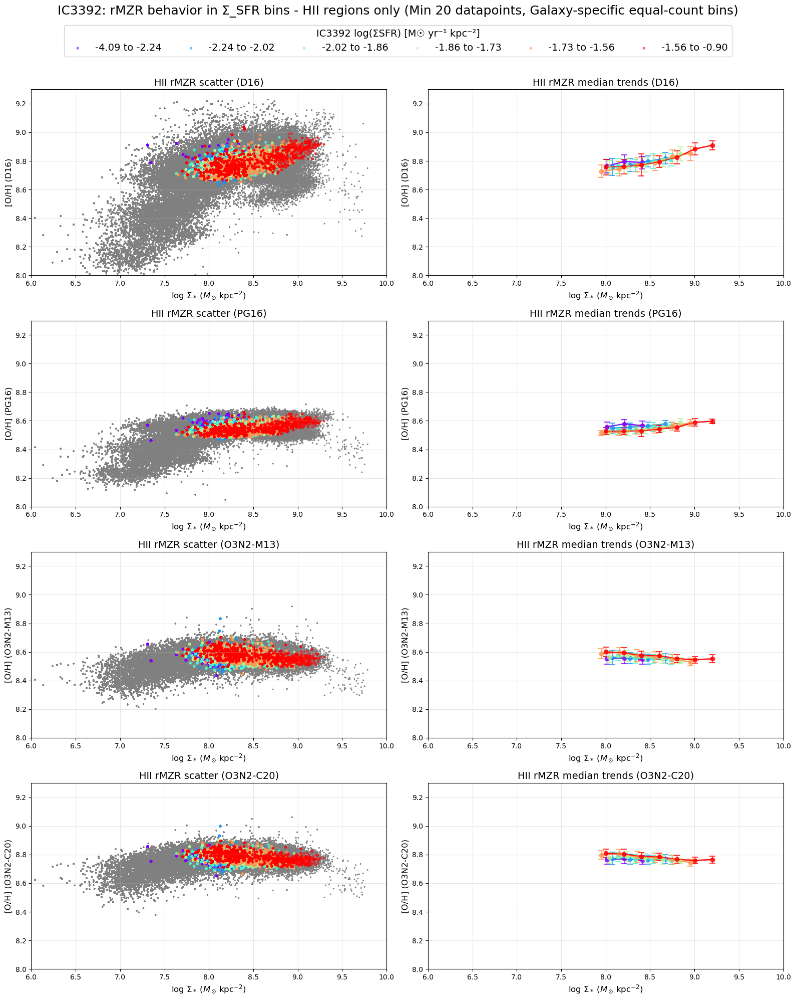


Successfully created 4x2 subplot figure for IC3392

Processing galaxy: NGC4064
Total HII pixels with all calibrations: 6820

NGC4064 SFR bin edges (equal-count per galaxy): [-3.99071018 -2.39106253 -2.04767199 -1.67957811 -1.27574929 -0.79395057
 -0.05361206]
  Bin 1: -3.99 to -2.39
  Bin 2: -2.39 to -2.05
  Bin 3: -2.05 to -1.68
  Bin 4: -1.68 to -1.28
  Bin 5: -1.28 to -0.79
  Bin 6: -0.79 to -0.05
    Bin 1 count: 1134
    Bin 2 count: 1139
    Bin 3 count: 1137
    Bin 4 count: 1135
    Bin 5 count: 1137
    Bin 6 count: 1138

Processing D16 calibration for HII regions:
  HII D16 range: 8.543 to 9.206
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.391 to 8.657
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.297 to 8.698
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.500 to 8.892
  Total valid bins: 6


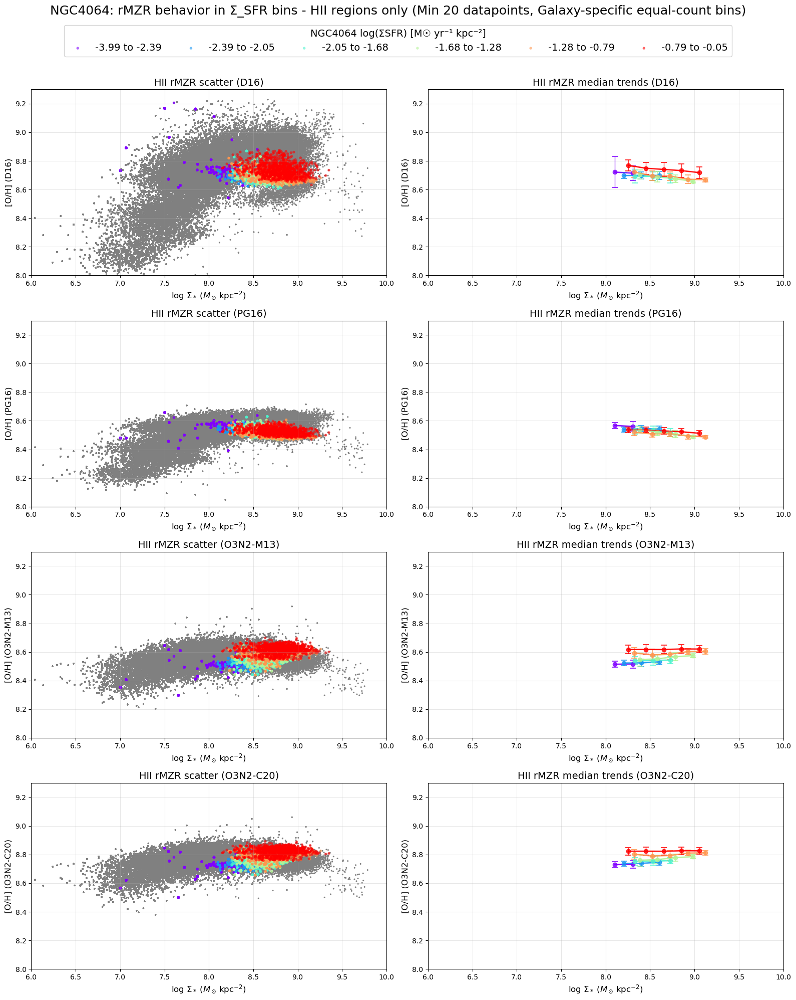


Successfully created 4x2 subplot figure for NGC4064

Processing galaxy: NGC4192
Total HII pixels with all calibrations: 145934

NGC4192 SFR bin edges (equal-count per galaxy): [-3.95988098 -3.03118018 -2.77589289 -2.56094506 -2.33989186 -2.04470293
 -0.06926812]
  Bin 1: -3.96 to -3.03
  Bin 2: -3.03 to -2.78
  Bin 3: -2.78 to -2.56
  Bin 4: -2.56 to -2.34
  Bin 5: -2.34 to -2.04
  Bin 6: -2.04 to -0.07
    Bin 1 count: 24325
    Bin 2 count: 24307
    Bin 3 count: 24258
    Bin 4 count: 24401
    Bin 5 count: 24315
    Bin 6 count: 24328

Processing D16 calibration for HII regions:
  HII D16 range: 8.523 to 9.222
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.414 to 8.715
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.398 to 8.918
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.614 to 9.061
  Total valid bins: 6


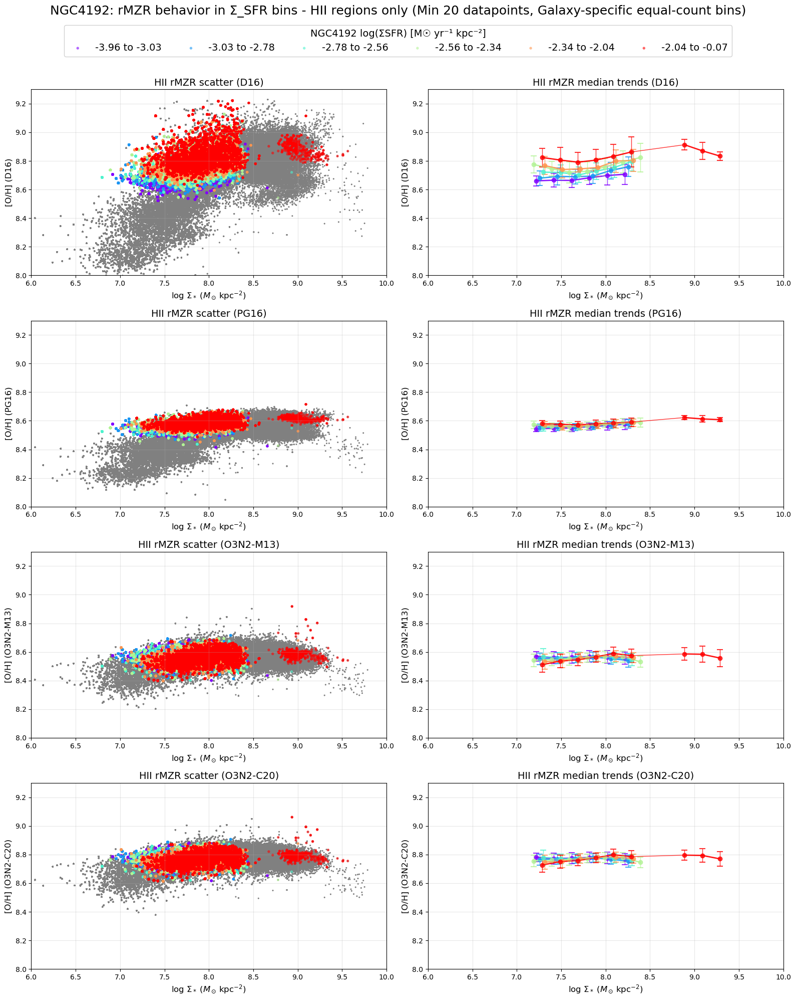


Successfully created 4x2 subplot figure for NGC4192

Processing galaxy: NGC4293
Total HII pixels with all calibrations: 3854

NGC4293 SFR bin edges (equal-count per galaxy): [-4.16404952 -3.84247559 -3.66930197 -3.51770939 -2.96555341 -2.4337186
 -0.94398755]
  Bin 1: -4.16 to -3.84
  Bin 2: -3.84 to -3.67
  Bin 3: -3.67 to -3.52
  Bin 4: -3.52 to -2.97
  Bin 5: -2.97 to -2.43
  Bin 6: -2.43 to -0.94
    Bin 1 count: 614
    Bin 2 count: 667
    Bin 3 count: 639
    Bin 4 count: 642
    Bin 5 count: 644
    Bin 6 count: 648

Processing D16 calibration for HII regions:
  HII D16 range: 7.941 to 9.218
  Total valid bins: 3

Processing PG16 calibration for HII regions:
  HII PG16 range: 7.796 to 8.707
  Total valid bins: 3

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.294 to 8.841
  Total valid bins: 3

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.496 to 9.004
  Total valid bins: 3


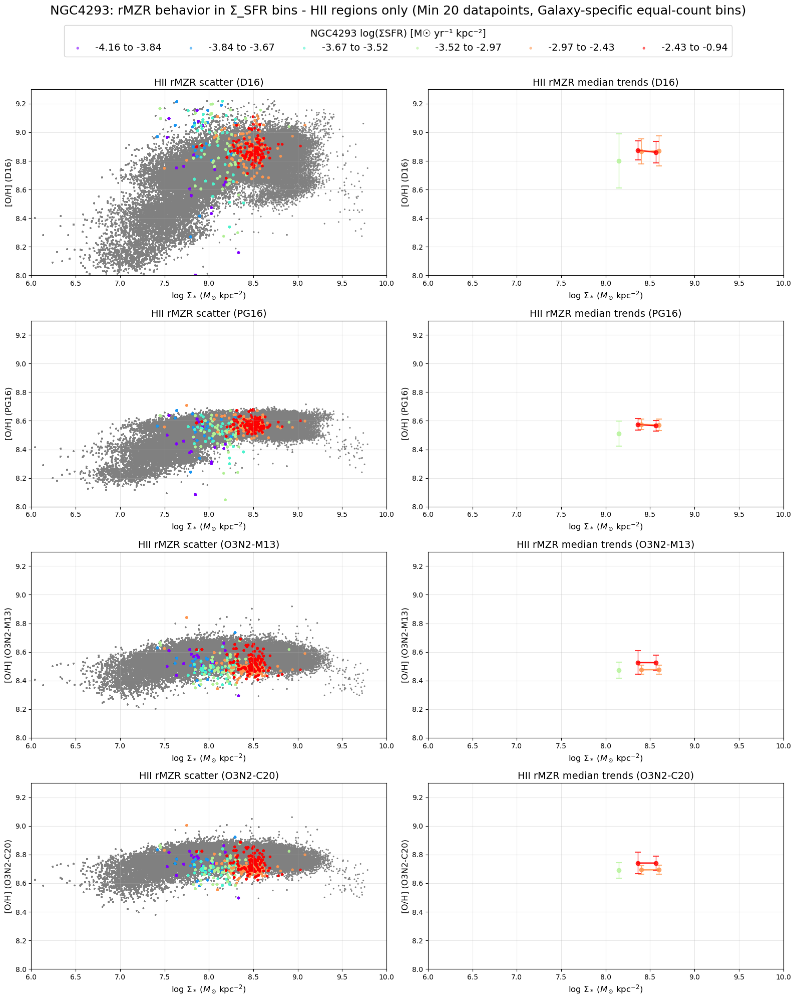


Successfully created 4x2 subplot figure for NGC4293

Processing galaxy: NGC4298
Total HII pixels with all calibrations: 156350

NGC4298 SFR bin edges (equal-count per galaxy): [-3.53434123 -2.72638748 -2.50094598 -2.28785577 -2.0650468  -1.8009926
  0.01896172]
  Bin 1: -3.53 to -2.73
  Bin 2: -2.73 to -2.50
  Bin 3: -2.50 to -2.29
  Bin 4: -2.29 to -2.07
  Bin 5: -2.07 to -1.80
  Bin 6: -1.80 to 0.02
    Bin 1 count: 26050
    Bin 2 count: 26061
    Bin 3 count: 26054
    Bin 4 count: 26069
    Bin 5 count: 26047
    Bin 6 count: 26069

Processing D16 calibration for HII regions:
  HII D16 range: 8.479 to 9.030
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.402 to 8.647
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.394 to 8.845
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.610 to 9.007
  Total valid bins: 6


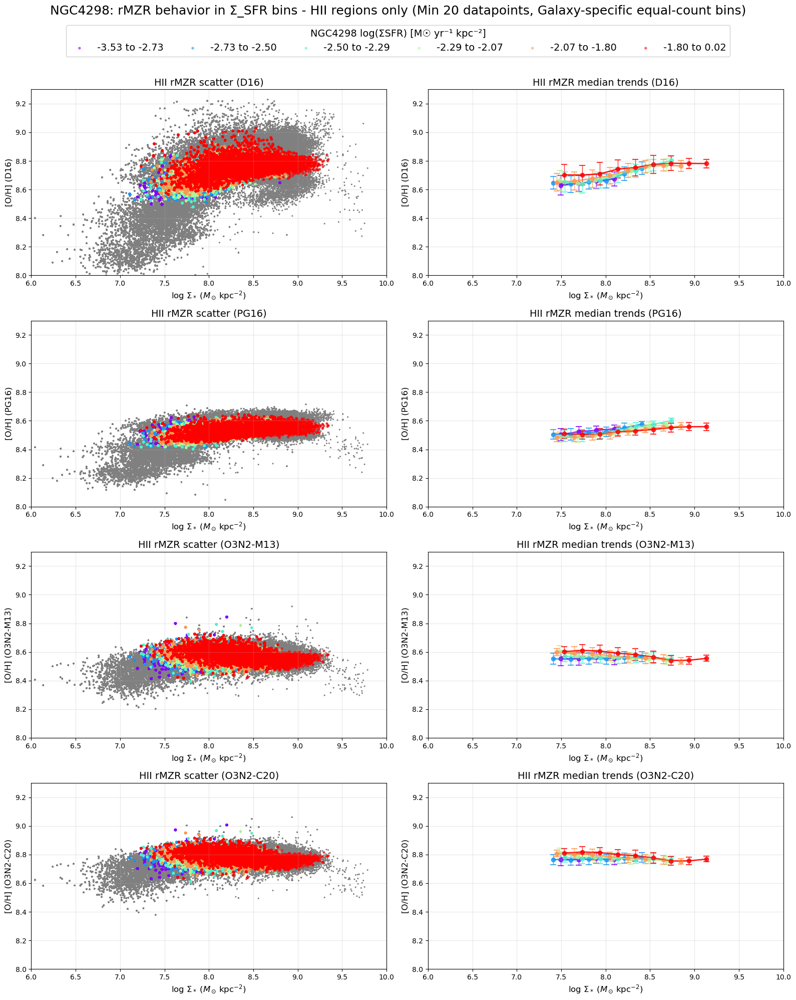


Successfully created 4x2 subplot figure for NGC4298

Processing galaxy: NGC4330
Total HII pixels with all calibrations: 42566

NGC4330 SFR bin edges (equal-count per galaxy): [-4.56674754 -3.31444738 -3.03354278 -2.79509459 -2.61296857 -2.37930919
 -1.15537185]
  Bin 1: -4.57 to -3.31
  Bin 2: -3.31 to -3.03
  Bin 3: -3.03 to -2.80
  Bin 4: -2.80 to -2.61
  Bin 5: -2.61 to -2.38
  Bin 6: -2.38 to -1.16
    Bin 1 count: 7092
    Bin 2 count: 7086
    Bin 3 count: 7105
    Bin 4 count: 7089
    Bin 5 count: 7098
    Bin 6 count: 7096

Processing D16 calibration for HII regions:
  HII D16 range: 8.171 to 8.887
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.228 to 8.581
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.300 to 8.700
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.503 to 8.893
  Total valid bins: 6


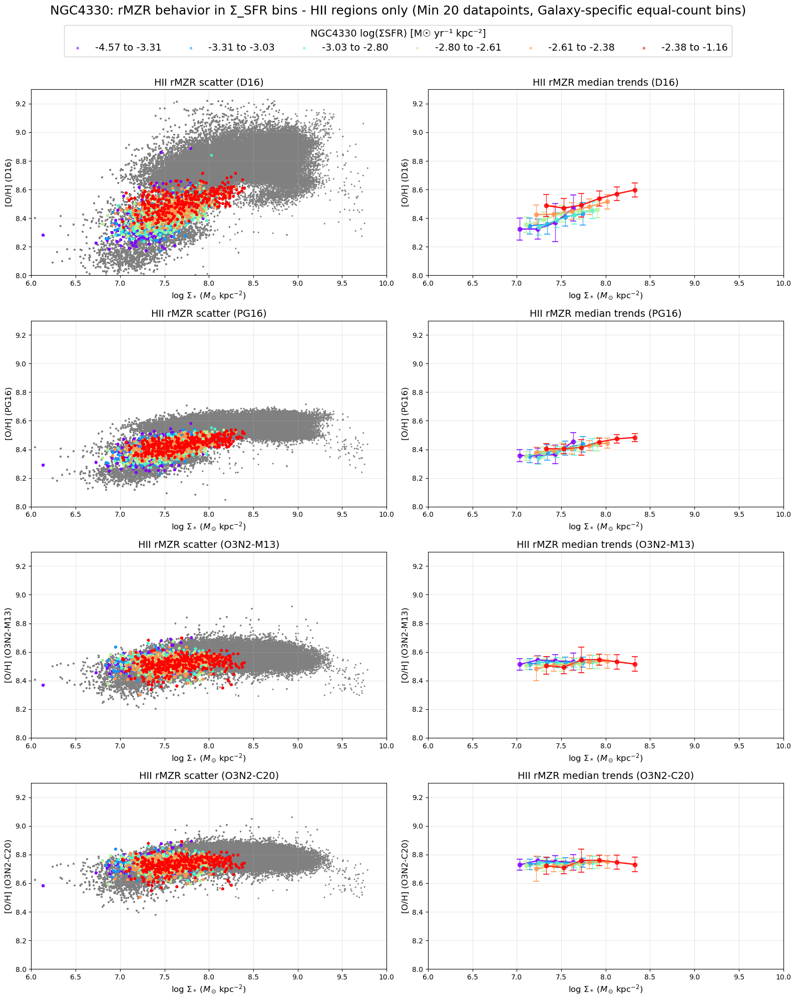


Successfully created 4x2 subplot figure for NGC4330

Skipping NGC4383 (excluded from analysis)

Processing galaxy: NGC4396
Total HII pixels with all calibrations: 81728

NGC4396 SFR bin edges (equal-count per galaxy): [-4.342716   -3.33104681 -3.06928427 -2.8331102  -2.58926283 -2.30541857
 -1.20780373]
  Bin 1: -4.34 to -3.33
  Bin 2: -3.33 to -3.07
  Bin 3: -3.07 to -2.83
  Bin 4: -2.83 to -2.59
  Bin 5: -2.59 to -2.31
  Bin 6: -2.31 to -1.21
    Bin 1 count: 13404
    Bin 2 count: 13819
    Bin 3 count: 13513
    Bin 4 count: 13737
    Bin 5 count: 13617
    Bin 6 count: 13638

Processing D16 calibration for HII regions:
  HII D16 range: 7.906 to 9.099
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.093 to 8.599
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.202 to 8.687
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.378 to 8.882
  Total valid bi

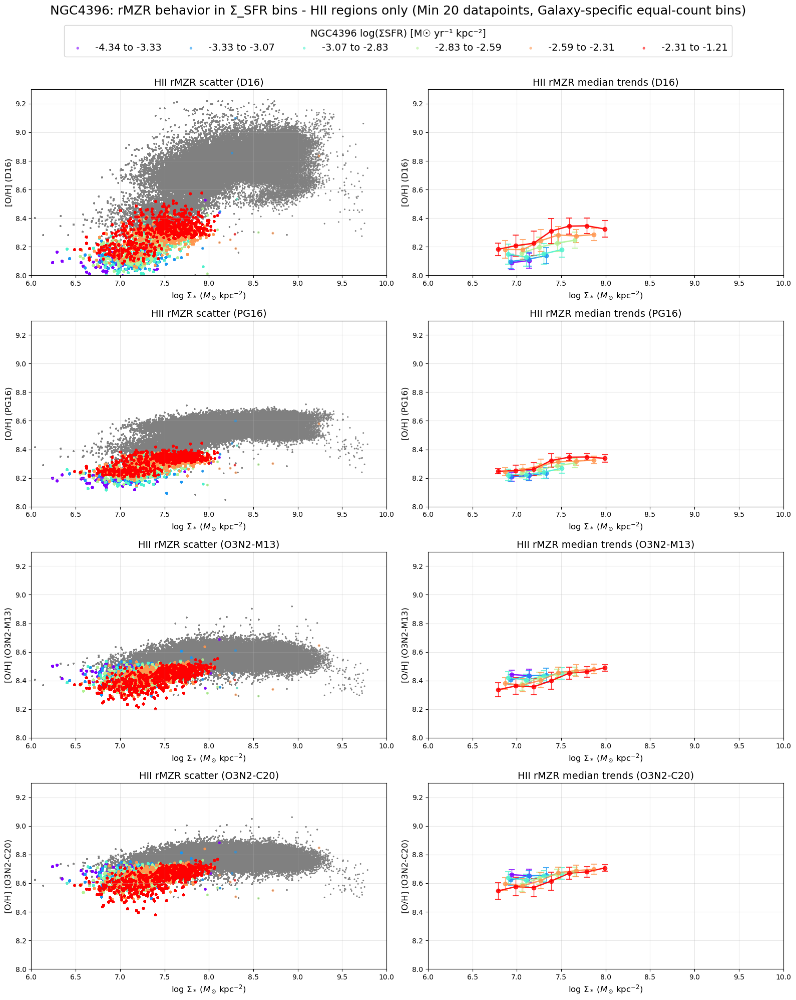


Successfully created 4x2 subplot figure for NGC4396

Processing galaxy: NGC4419
Total HII pixels with all calibrations: 6886

NGC4419 SFR bin edges (equal-count per galaxy): [-4.12627313 -2.63023506 -2.2295904  -1.96091281 -1.71612988 -1.44833615
 -0.34836246]
  Bin 1: -4.13 to -2.63
  Bin 2: -2.63 to -2.23
  Bin 3: -2.23 to -1.96
  Bin 4: -1.96 to -1.72
  Bin 5: -1.72 to -1.45
  Bin 6: -1.45 to -0.35
    Bin 1 count: 1147
    Bin 2 count: 1143
    Bin 3 count: 1153
    Bin 4 count: 1145
    Bin 5 count: 1144
    Bin 6 count: 1154

Processing D16 calibration for HII regions:
  HII D16 range: 8.432 to 9.130
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.340 to 8.675
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.300 to 8.902
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.505 to 9.049
  Total valid bins: 6


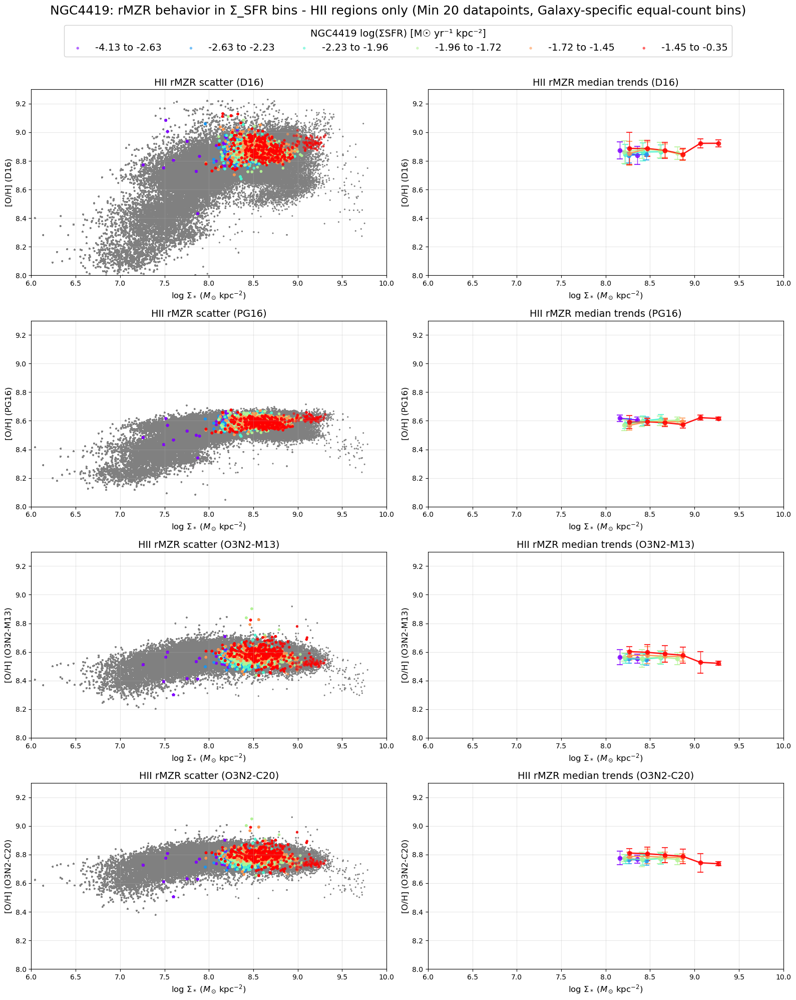


Successfully created 4x2 subplot figure for NGC4419

Processing galaxy: NGC4457
Total HII pixels with all calibrations: 6000

NGC4457 SFR bin edges (equal-count per galaxy): [-3.67279231 -1.89735481 -1.66897974 -1.49525548 -1.3099615  -1.08914939
 -0.30845644]
  Bin 1: -3.67 to -1.90
  Bin 2: -1.90 to -1.67
  Bin 3: -1.67 to -1.50
  Bin 4: -1.50 to -1.31
  Bin 5: -1.31 to -1.09
  Bin 6: -1.09 to -0.31
    Bin 1 count: 994
    Bin 2 count: 1005
    Bin 3 count: 985
    Bin 4 count: 1010
    Bin 5 count: 997
    Bin 6 count: 1009

Processing D16 calibration for HII regions:
  HII D16 range: 8.283 to 9.096
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.283 to 8.680
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.342 to 8.783
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.552 to 8.959
  Total valid bins: 6


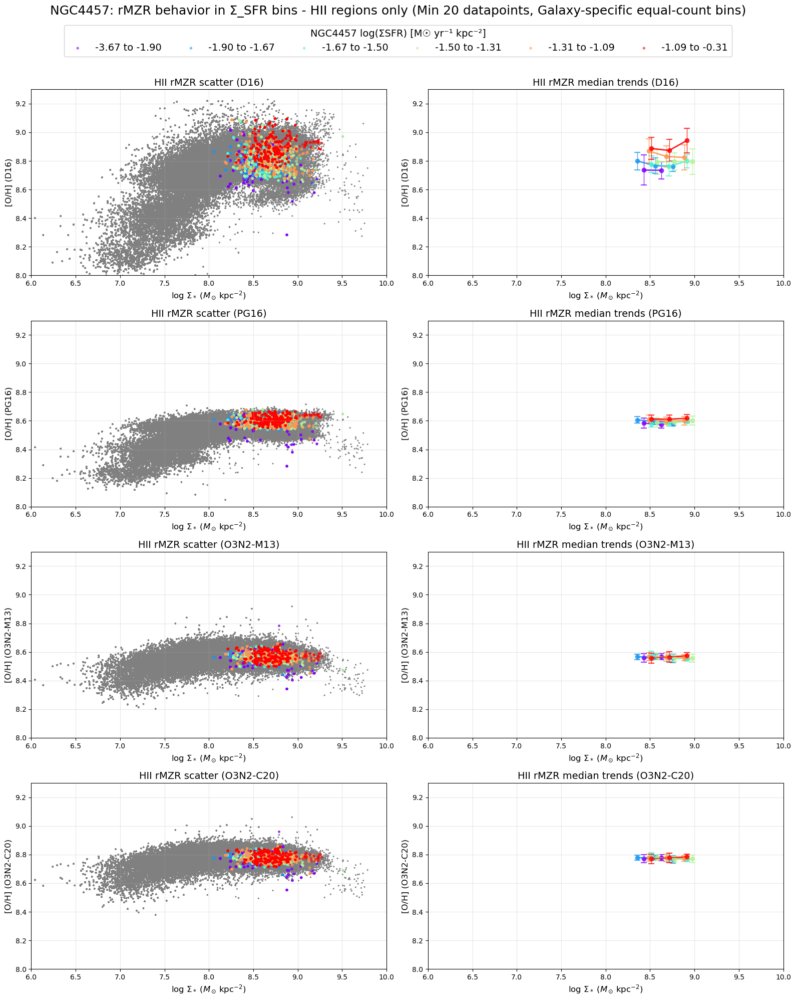


Successfully created 4x2 subplot figure for NGC4457

Processing galaxy: NGC4501
Total HII pixels with all calibrations: 260854

NGC4501 SFR bin edges (equal-count per galaxy): [-4.16710117 -2.48314096 -2.24140048 -2.04070004 -1.83845434 -1.58884104
 -0.07011133]
  Bin 1: -4.17 to -2.48
  Bin 2: -2.48 to -2.24
  Bin 3: -2.24 to -2.04
  Bin 4: -2.04 to -1.84
  Bin 5: -1.84 to -1.59
  Bin 6: -1.59 to -0.07
    Bin 1 count: 43467
    Bin 2 count: 43476
    Bin 3 count: 43481
    Bin 4 count: 43483
    Bin 5 count: 43460
    Bin 6 count: 43487

Processing D16 calibration for HII regions:
  HII D16 range: 8.494 to 9.229
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.351 to 8.698
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.391 to 8.786
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.607 to 8.962
  Total valid bins: 6


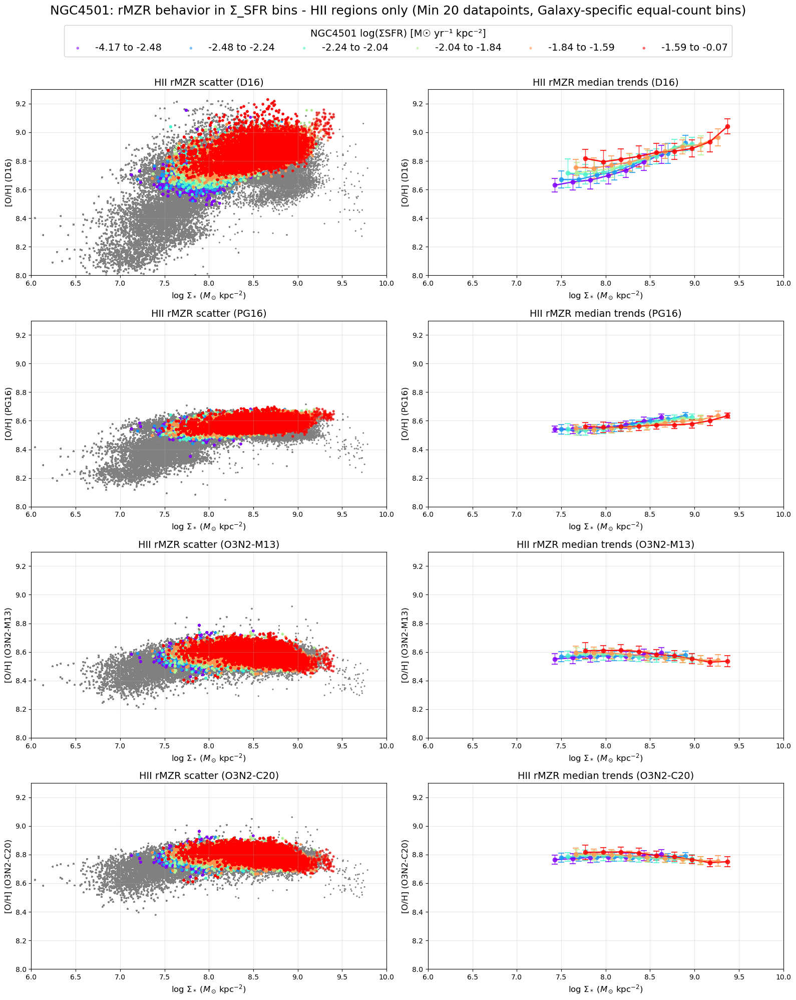


Successfully created 4x2 subplot figure for NGC4501

Processing galaxy: NGC4522
Total HII pixels with all calibrations: 39354

NGC4522 SFR bin edges (equal-count per galaxy): [-4.13990067 -3.22669784 -2.98875248 -2.72593924 -2.45363937 -2.14948912
 -0.37757127]
  Bin 1: -4.14 to -3.23
  Bin 2: -3.23 to -2.99
  Bin 3: -2.99 to -2.73
  Bin 4: -2.73 to -2.45
  Bin 5: -2.45 to -2.15
  Bin 6: -2.15 to -0.38
    Bin 1 count: 6509
    Bin 2 count: 6595
    Bin 3 count: 6530
    Bin 4 count: 6575
    Bin 5 count: 6579
    Bin 6 count: 6566

Processing D16 calibration for HII regions:
  HII D16 range: 8.239 to 8.927
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.300 to 8.598
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.361 to 8.677
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.574 to 8.874
  Total valid bins: 6


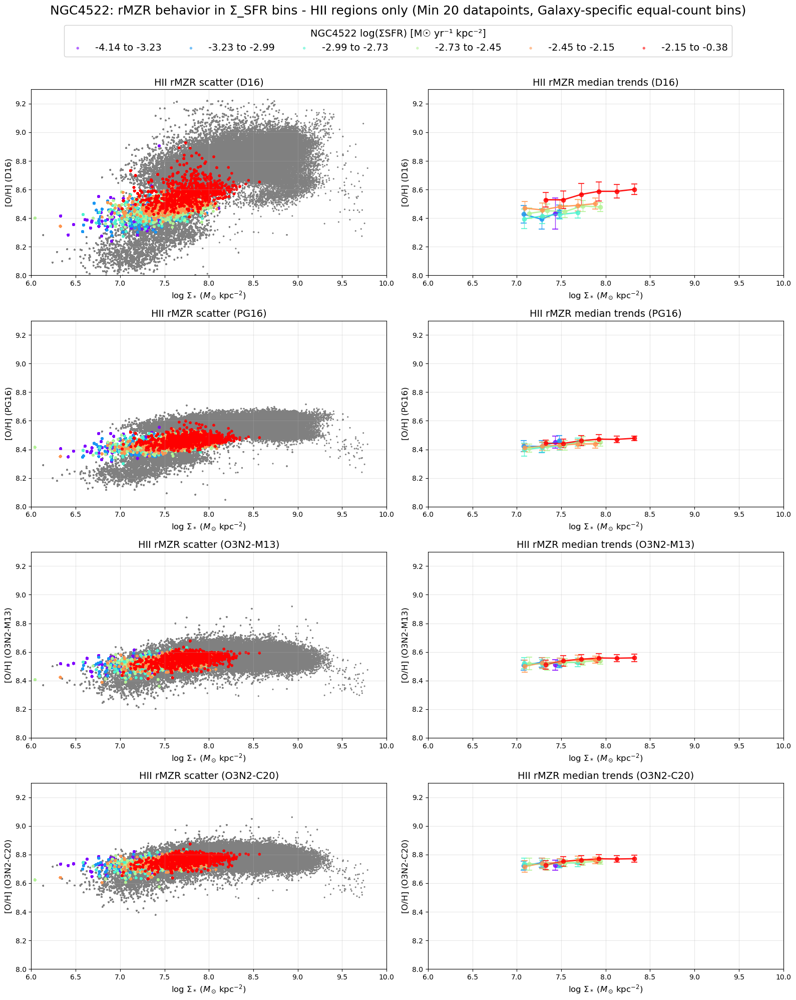


Successfully created 4x2 subplot figure for NGC4522

Processing galaxy: NGC4694
Total HII pixels with all calibrations: 2585

NGC4694 SFR bin edges (equal-count per galaxy): [-3.61018732 -2.27776626 -1.96221269 -1.72087437 -1.4902166  -1.11197082
 -0.21520635]
  Bin 1: -3.61 to -2.28
  Bin 2: -2.28 to -1.96
  Bin 3: -1.96 to -1.72
  Bin 4: -1.72 to -1.49
  Bin 5: -1.49 to -1.11
  Bin 6: -1.11 to -0.22
    Bin 1 count: 430
    Bin 2 count: 432
    Bin 3 count: 429
    Bin 4 count: 432
    Bin 5 count: 431
    Bin 6 count: 431

Processing D16 calibration for HII regions:
  HII D16 range: 8.303 to 9.119
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 8.271 to 8.612
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.381 to 8.641
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.595 to 8.844
  Total valid bins: 6


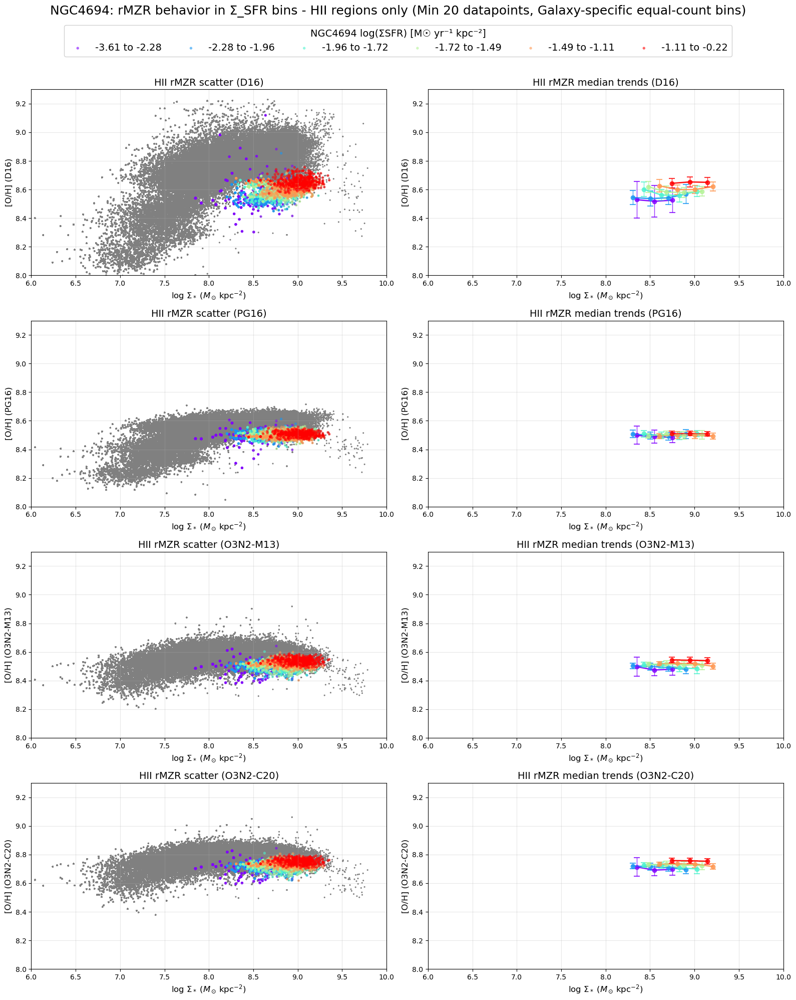


Successfully created 4x2 subplot figure for NGC4694

Processing galaxy: NGC4698
Total HII pixels with all calibrations: 10042

NGC4698 SFR bin edges (equal-count per galaxy): [-4.08573316 -3.22440376 -2.99566099 -2.83709558 -2.69190261 -2.46757717
 -1.53771911]
  Bin 1: -4.09 to -3.22
  Bin 2: -3.22 to -3.00
  Bin 3: -3.00 to -2.84
  Bin 4: -2.84 to -2.69
  Bin 5: -2.69 to -2.47
  Bin 6: -2.47 to -1.54
    Bin 1 count: 1580
    Bin 2 count: 1725
    Bin 3 count: 1696
    Bin 4 count: 1694
    Bin 5 count: 1669
    Bin 6 count: 1678

Processing D16 calibration for HII regions:
  HII D16 range: 8.274 to 9.219
  Total valid bins: 6

Processing PG16 calibration for HII regions:
  HII PG16 range: 7.645 to 8.689
  Total valid bins: 6

Processing O3N2-M13 calibration for HII regions:
  HII O3N2-M13 range: 8.297 to 8.778
  Total valid bins: 6

Processing O3N2-C20 calibration for HII regions:
  HII O3N2-C20 range: 8.500 to 8.956
  Total valid bins: 6


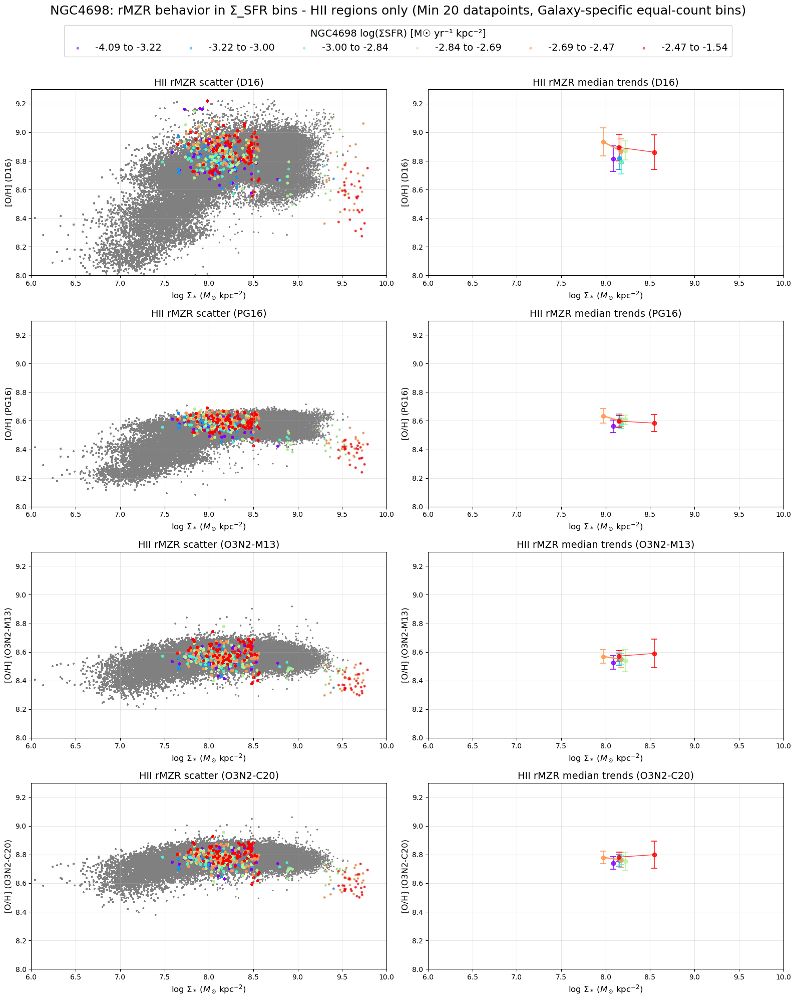


Successfully created 4x2 subplot figure for NGC4698

Finished processing all galaxies


In [4]:
# ------------------------------------------------------------------
# Individual Galaxy Analysis: rMZR behavior in Σ_SFR bins - HII regions only
# Loop through each galaxy individually
# SFR bins are calculated individually for each galaxy based on its own data
#
# 4 calibrations: D16, PG16, O3N2-M13, O3N2-C20
# Row 1: D16 (scatter left, median right)
# Row 2: PG16 (scatter left, median right)
# Row 3: O3N2-M13 (scatter left, median right)
# Row 4: O3N2-C20 (scatter left, median right)
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
import scipy.stats as stats

def load_maps_all_calibrations(gal):
    """Load all metallicity calibrations for HII regions"""
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # HII regions
        sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
        oh_d16_HII = h['O_H_D16_HII'].data
        oh_pg16_HII = h['O_H_PG16_HII'].data
        oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
        oh_o3n2_c20_HII = h['O_H_O3N2_C20_HII'].data
    return (sigM, sigSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, oh_o3n2_c20_HII)

def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
    """Calculate median and std in stellar mass bins - only keep bins with >= 20 unique datapoints"""
    # Define mass bins
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    mass_bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    mass_bin_centers = (mass_bin_edges[:-1] + mass_bin_edges[1:]) / 2
    
    medians = []
    stds = []
    counts = []
    valid_centers = []
    valid_bin_indices = []
    
    for i, (bin_start, bin_end) in enumerate(zip(mass_bin_edges[:-1], mass_bin_edges[1:])):
        # Select data in this mass bin
        in_mass_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_mass_bin]
        
        if len(np.unique(y_in_bin)) >= min_pixels:
            medians.append(np.median(y_in_bin))
            stds.append(np.std(y_in_bin))
            counts.append(len(y_in_bin))
            valid_centers.append(mass_bin_centers[i])
            valid_bin_indices.append(i)
    
    return (np.array(valid_centers), np.array(medians), np.array(stds), 
            np.array(counts), np.array(valid_bin_indices))

# Get all galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Galaxies to exclude entirely
excluded_galaxies = {'NGC4383'}
included_galaxies = []

# ==============================================================================
# First, collect combined data from all galaxies (for background gray scatter)
# ==============================================================================
print("="*80)
print("STEP 1: Collecting combined data from all galaxies for background...")
print("="*80)

all_logSigmaM_HII = []
all_logSigmaSFR_HII = []
all_oh_d16_HII = []
all_oh_pg16_HII = []
all_oh_o3n2_m13_HII = []
all_oh_o3n2_c20_HII = []

for gal in galaxies:
    if gal in excluded_galaxies:
        print(f"  {gal}: excluded from combined dataset")
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    if bin_file.exists() and gas_file.exists():
        # Load all data for HII regions
        (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
         oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

        # Find common spaxels for HII regions
        common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                           np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                           np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
        
        print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
        
        # Append HII data
        all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
        all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
        all_oh_d16_HII.extend(oh_d16_HII[common_mask_HII].flatten())
        all_oh_pg16_HII.extend(oh_pg16_HII[common_mask_HII].flatten())
        all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
        all_oh_o3n2_c20_HII.extend(oh_o3n2_c20_HII[common_mask_HII].flatten())

# Convert to numpy arrays
all_logSigmaM_HII = np.array(all_logSigmaM_HII)
all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
all_oh_d16_HII = np.array(all_oh_d16_HII)
all_oh_pg16_HII = np.array(all_oh_pg16_HII)
all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
all_oh_o3n2_c20_HII = np.array(all_oh_o3n2_c20_HII)

# Store combined data in a dictionary for easy access
combined_calib_map = {
    'oh_d16_HII': all_oh_d16_HII,
    'oh_pg16_HII': all_oh_pg16_HII,
    'oh_o3n2_m13_HII': all_oh_o3n2_m13_HII,
    'oh_o3n2_c20_HII': all_oh_o3n2_c20_HII
}

print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")

# ==============================================================================
# Define plotting parameters
# ==============================================================================
n_bins = 6

# Set uniform y-axis range
common_ylim = (8.0, 9.3)

print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# Data for each calibration
calibrations = [
    ('oh_d16_HII', 'D16'),
    ('oh_pg16_HII', 'PG16'),
    ('oh_o3n2_m13_HII', 'O3N2-M13'),
    ('oh_o3n2_c20_HII', 'O3N2-C20')
]

# ==============================================================================
# STEP 2: Loop through each galaxy and plot individual data + combined background
# ==============================================================================
print("\n" + "="*80)
print("STEP 2: Processing individual galaxies...")
print("="*80)

for gal in galaxies:
    if gal in excluded_galaxies:
        print(f"\n{'='*80}")
        print(f"Skipping {gal} (excluded from analysis)")
        print(f"{'='*80}")
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    if not (bin_file.exists() and gas_file.exists()):
        print(f"\n{'='*80}")
        print(f"Skipping {gal} (data files not found)")
        print(f"{'='*80}")
        continue

    print(f"\n{'='*80}")
    print(f"Processing galaxy: {gal}")
    print(f"{'='*80}")

    # Load all data for this galaxy
    (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
     oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

    # Find common spaxels for HII regions
    common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                       np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                       np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
    
    n_pixels_total = np.sum(common_mask_HII)
    print(f"Total HII pixels with all calibrations: {n_pixels_total}")
    
    if n_pixels_total == 0:
        print(f"No valid pixels for {gal}, skipping...")
        continue

    # Get flattened arrays for this galaxy
    gal_logSigmaM = logSigmaM[common_mask_HII].flatten()
    gal_logSigmaSFR_HII = logSigmaSFR_HII[common_mask_HII].flatten()
    gal_oh_d16_HII = oh_d16_HII[common_mask_HII].flatten()
    gal_oh_pg16_HII = oh_pg16_HII[common_mask_HII].flatten()
    gal_oh_o3n2_m13_HII = oh_o3n2_m13_HII[common_mask_HII].flatten()
    gal_oh_o3n2_c20_HII = oh_o3n2_c20_HII[common_mask_HII].flatten()

    # ==============================================================================
    # Calculate SFR bins for THIS GALAXY based on its own data distribution
    # ==============================================================================
    percentiles = [0, 16.67, 33.33, 50, 66.67, 83.33, 100]
    gal_sfr_bin_edges = np.percentile(gal_logSigmaSFR_HII, percentiles)
    
    # Create bin labels with actual values for this galaxy
    gal_bin_labels = []
    for i in range(n_bins):
        gal_bin_labels.append(f'{gal_sfr_bin_edges[i]:.2f} to {gal_sfr_bin_edges[i+1]:.2f}')
    
    print(f"\n{gal} SFR bin edges (equal-count per galaxy): {gal_sfr_bin_edges}")
    for i, label in enumerate(gal_bin_labels):
        print(f"  Bin {i+1}: {label}")
    
    # Verify bin counts for this galaxy
    for i in range(n_bins):
        if i == 0:
            mask = (gal_logSigmaSFR_HII >= gal_sfr_bin_edges[i]) & (gal_logSigmaSFR_HII < gal_sfr_bin_edges[i+1])
        elif i == n_bins - 1:
            mask = (gal_logSigmaSFR_HII >= gal_sfr_bin_edges[i]) & (gal_logSigmaSFR_HII <= gal_sfr_bin_edges[i+1])
        else:
            mask = (gal_logSigmaSFR_HII >= gal_sfr_bin_edges[i]) & (gal_logSigmaSFR_HII < gal_sfr_bin_edges[i+1])
        print(f"    Bin {i+1} count: {np.sum(mask)}")
    
    # Colors for different bins
    colors = plt.cm.rainbow(np.linspace(0, 1, n_bins))

    # Map calibration variable names to actual data for this galaxy
    calib_data_map = {
        'oh_d16_HII': gal_oh_d16_HII,
        'oh_pg16_HII': gal_oh_pg16_HII,
        'oh_o3n2_m13_HII': gal_oh_o3n2_m13_HII,
        'oh_o3n2_c20_HII': gal_oh_o3n2_c20_HII
    }

    # Create figure with 4 rows x 2 columns 
    fig, axes = plt.subplots(4, 2, figsize=(16, 20))

    # Create legend handles (will be populated during first row)
    legend_handles = []
    legend_labels = []

    # Process each row (1 calibration per row)
    for row_idx, (calib_key, calib_name_HII) in enumerate(calibrations):
        print(f"\nProcessing {calib_name_HII} calibration for HII regions:")
        
        # Get the data for this calibration (individual galaxy)
        oh_data_HII = calib_data_map[calib_key]
        
        # Get the combined data for this calibration (all galaxies)
        oh_combined_HII = combined_calib_map[calib_key]
        
        # Column 0: Scatter plot, Column 1: Median trends
        ax_scatter = axes[row_idx, 0]
        ax_median = axes[row_idx, 1]
        
        print(f"  HII {calib_name_HII} range: {np.min(oh_data_HII):.3f} to {np.max(oh_data_HII):.3f}")
        
        # FIRST: Plot combined galaxy data as gray background
        ax_scatter.scatter(all_logSigmaM_HII, oh_combined_HII, 
                         c='gray', s=5, alpha=1.0, edgecolors='none', 
                         rasterized=True, label='All galaxies')
        
        # SECOND: Plot each Σ_SFR bin for this individual galaxy
        valid_bins = 0
        
        for i in range(n_bins):
            # HII regions processing - handle edge cases for first and last bins
            # Use THIS GALAXY's bin edges
            if i == 0:
                in_bin_HII = (gal_logSigmaSFR_HII >= gal_sfr_bin_edges[i]) & (gal_logSigmaSFR_HII < gal_sfr_bin_edges[i+1])
            elif i == n_bins - 1:
                in_bin_HII = (gal_logSigmaSFR_HII >= gal_sfr_bin_edges[i]) & (gal_logSigmaSFR_HII <= gal_sfr_bin_edges[i+1])
            else:
                in_bin_HII = (gal_logSigmaSFR_HII >= gal_sfr_bin_edges[i]) & (gal_logSigmaSFR_HII < gal_sfr_bin_edges[i+1])
            
            n_pixels_HII = np.sum(in_bin_HII)
            
            if n_pixels_HII >= 10:  # Process bins with enough pixels
                # Get data for this bin
                x_bin_HII = gal_logSigmaM[in_bin_HII]
                y_bin_HII = oh_data_HII[in_bin_HII]
                
                # Scatter plot (individual galaxy on top of gray background)
                scatter_hii = ax_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors[i]], s=15, alpha=0.6, 
                                     edgecolors='none', rasterized=True)
                
                # Collect legend info only from first row
                if row_idx == 0 and len(legend_handles) < n_bins:
                    legend_handles.append(scatter_hii)
                    legend_labels.append(gal_bin_labels[i])
                
                # Median trends
                mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
                    x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
                
                if len(mass_centers_HII) > 0:
                    ax_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, 
                               color=colors[i], marker='o', markersize=6, 
                               linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                    
                    # Add lines between adjacent bins
                    for j in range(len(valid_bin_indices_HII) - 1):
                        current_bin_idx = valid_bin_indices_HII[j]
                        next_bin_idx = valid_bin_indices_HII[j + 1]
                        if next_bin_idx - current_bin_idx == 1:
                            ax_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], 
                                   [medians_HII[j], medians_HII[j + 1]], 
                                   color=colors[i], linewidth=2, alpha=0.8)
                    valid_bins += 1
        
        # Format scatter plot
        ax_scatter.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        ax_scatter.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
        ax_scatter.set_title(f'HII rMZR scatter ({calib_name_HII})', fontsize=14)
        ax_scatter.grid(True, alpha=0.3)
        ax_scatter.set_xlim(6, 10)
        ax_scatter.set_ylim(common_ylim)
        
        # Format median trends plot
        ax_median.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        ax_median.set_ylabel(f'[O/H] ({calib_name_HII})', fontsize=12)
        ax_median.set_title(f'HII rMZR median trends ({calib_name_HII})', fontsize=14)
        ax_median.grid(True, alpha=0.3)
        ax_median.set_xlim(6, 10)
        ax_median.set_ylim(common_ylim)
        
        print(f"  Total valid bins: {valid_bins}")

    # Add overall title and adjust layout
    fig.suptitle(f'{gal}: rMZR behavior in Σ_SFR bins - HII regions only (Min 20 datapoints, Galaxy-specific equal-count bins)', 
                 fontsize=18, y=0.995)

    # Add shared legend at the top horizontally
    fig.legend(legend_handles, legend_labels, loc='upper center', bbox_to_anchor=(0.5, 0.98),
              ncol=min(len(legend_labels), 7), fontsize=14, framealpha=0.9, 
              title=f'{gal} log(ΣSFR) [M☉ yr⁻¹ kpc⁻²]', title_fontsize=14)

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for suptitle and legend
    # plt.savefig(f'{gal}_rMZR_HII_only_4calibrations_4x2grid_3bins_equalcount_pergalaxy.png', dpi=300, bbox_inches='tight')
    # plt.savefig(f'{gal}_rMZR_HII_only_4calibrations_4x2grid_3bins_equalcount_pergalaxy.pdf', bbox_inches='tight')
    plt.show()

    print(f"\nSuccessfully created 4x2 subplot figure for {gal}")

print(f"\n{'='*80}")
print("Finished processing all galaxies")
print(f"{'='*80}")

## 20251007 Try seperate the combinded rMZR plots into two branches: outliers and majority
Remember, except the NGC4383 that has been excluded, the other abnormal galaxies are: NGC4330, NGC4396, NGC4522 and NGC4694.
1. NGC4330: low mass end, metallicity anti-correlate with SFR, match expected trend
2. NGC4396: low mass end, metallicity anti-correlate with SFR, match expected trend
3. NGC4522: low mass end, can't see clear trend
4. NGC4694: high mass end, metallicity anti-correlate with SFR, match expected trend

STEP 1: Collecting combined data from all 13 galaxies for background...

  IC3392: HII=14884 pixels
  NGC4064: HII=6820 pixels
  NGC4192: HII=145934 pixels
  NGC4293: HII=3854 pixels
  NGC4298: HII=156350 pixels
  NGC4330: HII=42566 pixels
  NGC4383: excluded from analysis
  NGC4396: HII=81728 pixels
  NGC4419: HII=6886 pixels
  NGC4457: HII=6000 pixels
  NGC4501: HII=260854 pixels
  NGC4522: HII=39354 pixels
  NGC4694: HII=2585 pixels
  NGC4698: HII=10042 pixels

Total combined pixels (HII): 777857

Normal galaxies (9): IC3392, NGC4064, NGC4192, NGC4293, NGC4298, NGC4419, NGC4457, NGC4501, NGC4698
Abnormal galaxies (4): NGC4330, NGC4396, NGC4522, NGC4694

Using uniform y-axis range: 8.0 to 9.3

Processing Normal/Majority Galaxies: IC3392, NGC4064, NGC4192, NGC4293, NGC4298, NGC4419, NGC4457, NGC4501, NGC4698

Total Normal/Majority Galaxies pixels (HII): 611624

Normal/Majority Galaxies SFR bin edges (equal-count): [-4.16710117 -2.747376   -2.46270504 -2.22214178 -1.98032654 -1.6953349

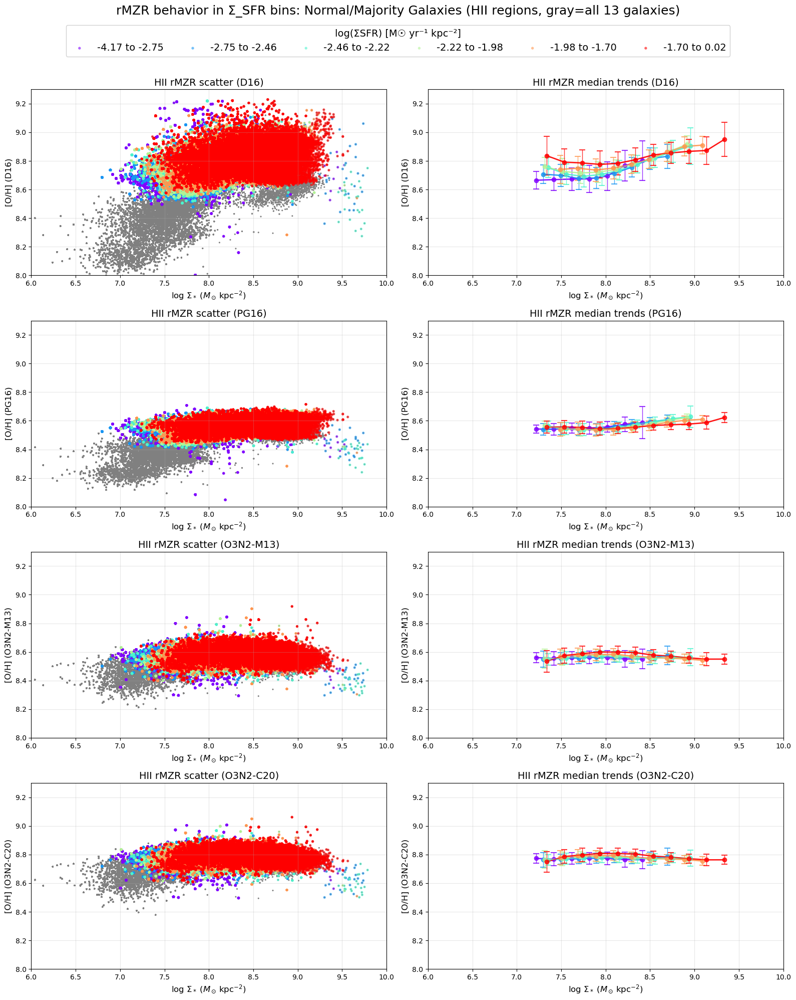


Successfully created figure for Normal/Majority Galaxies
Galaxies in this group: IC3392, NGC4064, NGC4192, NGC4293, NGC4298, NGC4419, NGC4457, NGC4501, NGC4698

Processing Abnormal Galaxies: NGC4330, NGC4396, NGC4522, NGC4694

Total Abnormal Galaxies pixels (HII): 166233

Abnormal Galaxies SFR bin edges (equal-count): [-4.56674754 -3.28352816 -3.03464294 -2.79046015 -2.5579094  -2.25990384
 -0.21520635]
  Bin 1: -4.57 to -3.28
  Bin 2: -3.28 to -3.03
  Bin 3: -3.03 to -2.79
  Bin 4: -2.79 to -2.56
  Bin 5: -2.56 to -2.26
  Bin 6: -2.26 to -0.22
    Bin 1 count: 27678
    Bin 2 count: 27709
    Bin 3 count: 27667
    Bin 4 count: 27747
    Bin 5 count: 27706
    Bin 6 count: 27726

  Processing D16 calibration:
    Abnormal Galaxies D16 range: 7.906 to 9.119
    Total valid bins: 6

  Processing PG16 calibration:
    Abnormal Galaxies PG16 range: 8.093 to 8.612
    Total valid bins: 6

  Processing O3N2-M13 calibration:
    Abnormal Galaxies O3N2-M13 range: 8.202 to 8.700
    Total val

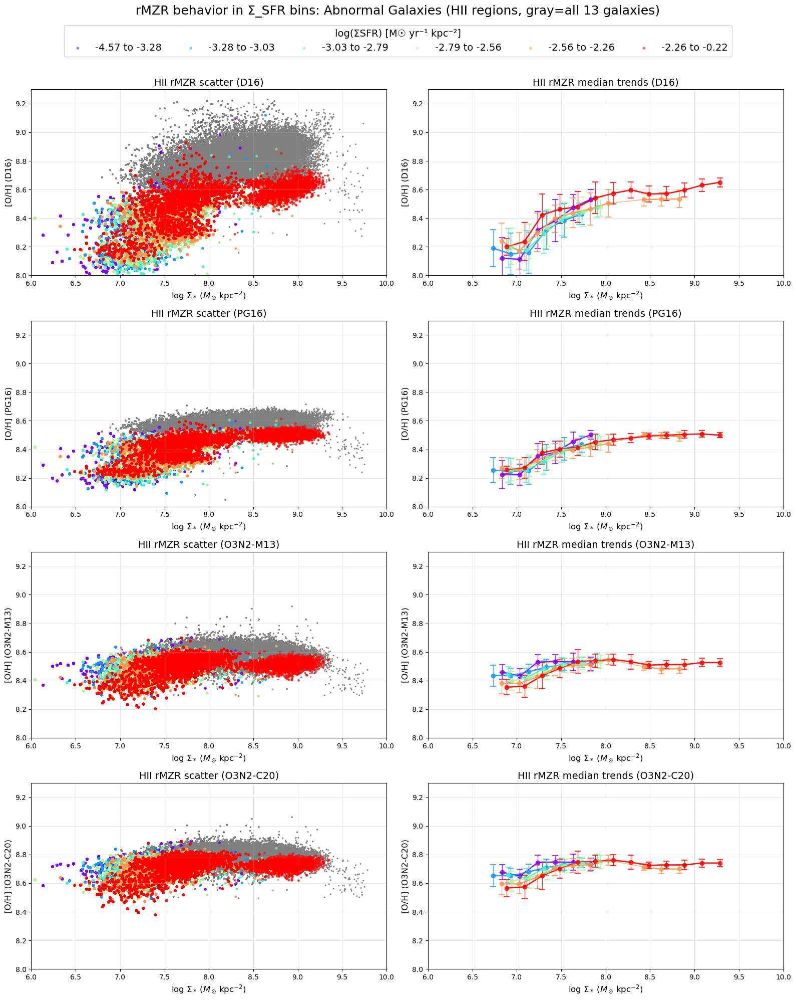


Successfully created figure for Abnormal Galaxies
Galaxies in this group: NGC4330, NGC4396, NGC4522, NGC4694

COMPLETED: Created 2 separate plots for Normal and Abnormal galaxy groups


In [5]:
# ------------------------------------------------------------------
# Individual Galaxy Analysis: rMZR behavior in Σ_SFR bins - HII regions only
# Dividing galaxies into 2 groups:
# - Abnormal group: NGC4330, NGC4396, NGC4522, NGC4694
# - Normal/Majority group: The rest
# Each group gets its own figure with combined data as gray background
# 4 rows x 2 columns: Each row shows 1 indicator (scatter on left, median on right)
# 4 calibrations: D16, PG16, O3N2-M13, O3N2-C20
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
import scipy.stats as stats

def load_maps_all_calibrations(gal):
    """Load all metallicity calibrations for HII regions"""
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # HII regions
        sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
        oh_d16_HII = h['O_H_D16_HII'].data
        oh_pg16_HII = h['O_H_PG16_HII'].data
        oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
        oh_o3n2_c20_HII = h['O_H_O3N2_C20_HII'].data
    return (sigM, sigSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, oh_o3n2_c20_HII)

def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
    """Calculate median and std in stellar mass bins - only keep bins with >= 20 unique datapoints"""
    # Define mass bins
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    mass_bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    mass_bin_centers = (mass_bin_edges[:-1] + mass_bin_edges[1:]) / 2
    
    medians = []
    stds = []
    counts = []
    valid_centers = []
    valid_bin_indices = []
    
    for i, (bin_start, bin_end) in enumerate(zip(mass_bin_edges[:-1], mass_bin_edges[1:])):
        # Select data in this mass bin
        in_mass_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_mass_bin]
        
        if len(np.unique(y_in_bin)) >= min_pixels:
            medians.append(np.median(y_in_bin))
            stds.append(np.std(y_in_bin))
            counts.append(len(y_in_bin))
            valid_centers.append(mass_bin_centers[i])
            valid_bin_indices.append(i)
    
    return (np.array(valid_centers), np.array(medians), np.array(stds), 
            np.array(counts), np.array(valid_bin_indices))

# Get all galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Galaxies to exclude entirely
excluded_galaxies = {'NGC4383'}

# Define galaxy groups
abnormal_galaxies = {'NGC4330', 'NGC4396', 'NGC4522', 'NGC4694'}
# Normal galaxies are all others (excluding NGC4383)

# ==============================================================================
# STEP 1: Collect combined data from all 13 galaxies (for gray background)
# ==============================================================================
print("="*80)
print("STEP 1: Collecting combined data from all 13 galaxies for background...")
print("="*80)

all_logSigmaM_HII = []
all_logSigmaSFR_HII = []
all_oh_d16_HII = []
all_oh_pg16_HII = []
all_oh_o3n2_m13_HII = []
all_oh_o3n2_c20_HII = []

normal_galaxies_list = []
abnormal_galaxies_list = []

print("\nCollecting data from all galaxies for HII regions...")
for gal in galaxies:
    if gal in excluded_galaxies:
        print(f"  {gal}: excluded from analysis")
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    if bin_file.exists() and gas_file.exists():
        # Categorize galaxy
        if gal in abnormal_galaxies:
            abnormal_galaxies_list.append(gal)
        else:
            normal_galaxies_list.append(gal)
        
        # Load all data for HII regions
        (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
         oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

        # Find common spaxels for HII regions
        common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                           np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                           np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
        
        print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
        
        # Append HII data
        all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
        all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
        all_oh_d16_HII.extend(oh_d16_HII[common_mask_HII].flatten())
        all_oh_pg16_HII.extend(oh_pg16_HII[common_mask_HII].flatten())
        all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
        all_oh_o3n2_c20_HII.extend(oh_o3n2_c20_HII[common_mask_HII].flatten())
    else:
        print(f"  {gal}: Data files not found")

# Convert to numpy arrays
all_logSigmaM_HII = np.array(all_logSigmaM_HII)
all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
all_oh_d16_HII = np.array(all_oh_d16_HII)
all_oh_pg16_HII = np.array(all_oh_pg16_HII)
all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
all_oh_o3n2_c20_HII = np.array(all_oh_o3n2_c20_HII)

# Store combined data in a dictionary for easy access
combined_calib_map = {
    'oh_d16_HII': all_oh_d16_HII,
    'oh_pg16_HII': all_oh_pg16_HII,
    'oh_o3n2_m13_HII': all_oh_o3n2_m13_HII,
    'oh_o3n2_c20_HII': all_oh_o3n2_c20_HII
}

print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")
print(f"\nNormal galaxies ({len(normal_galaxies_list)}): {', '.join(sorted(normal_galaxies_list))}")
print(f"Abnormal galaxies ({len(abnormal_galaxies_list)}): {', '.join(sorted(abnormal_galaxies_list))}")

# ==============================================================================
# Define plotting parameters
# ==============================================================================
n_bins = 6

# Set uniform y-axis range
common_ylim = (8.0, 9.3)

print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# Data for each calibration
calibrations = [
    ('oh_d16_HII', 'D16'),
    ('oh_pg16_HII', 'PG16'),
    ('oh_o3n2_m13_HII', 'O3N2-M13'),
    ('oh_o3n2_c20_HII', 'O3N2-C20')
]

# ==============================================================================
# STEP 2: Loop through each galaxy group and create separate plots
# ==============================================================================
galaxy_groups = [
    (normal_galaxies_list, 'Normal/Majority Galaxies'),
    (abnormal_galaxies_list, 'Abnormal Galaxies')
]

for group_galaxies, group_name in galaxy_groups:
    print("\n" + "="*80)
    print(f"Processing {group_name}: {', '.join(sorted(group_galaxies))}")
    print("="*80)
    
    # ==============================================================================
    # Collect data for this galaxy group
    # ==============================================================================
    group_logSigmaM_HII = []
    group_logSigmaSFR_HII = []
    group_oh_d16_HII = []
    group_oh_pg16_HII = []
    group_oh_o3n2_m13_HII = []
    group_oh_o3n2_c20_HII = []
    
    for gal in group_galaxies:
        bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
        gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

        if bin_file.exists() and gas_file.exists():
            # Load all data for this galaxy
            (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
             oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

            # Find common spaxels for HII regions
            common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                               np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                               np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
            
            # Append data
            group_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
            group_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
            group_oh_d16_HII.extend(oh_d16_HII[common_mask_HII].flatten())
            group_oh_pg16_HII.extend(oh_pg16_HII[common_mask_HII].flatten())
            group_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
            group_oh_o3n2_c20_HII.extend(oh_o3n2_c20_HII[common_mask_HII].flatten())
    
    # Convert to numpy arrays
    group_logSigmaM_HII = np.array(group_logSigmaM_HII)
    group_logSigmaSFR_HII = np.array(group_logSigmaSFR_HII)
    group_oh_d16_HII = np.array(group_oh_d16_HII)
    group_oh_pg16_HII = np.array(group_oh_pg16_HII)
    group_oh_o3n2_m13_HII = np.array(group_oh_o3n2_m13_HII)
    group_oh_o3n2_c20_HII = np.array(group_oh_o3n2_c20_HII)
    
    # Map calibration variable names to actual data for this group
    group_calib_data_map = {
        'oh_d16_HII': group_oh_d16_HII,
        'oh_pg16_HII': group_oh_pg16_HII,
        'oh_o3n2_m13_HII': group_oh_o3n2_m13_HII,
        'oh_o3n2_c20_HII': group_oh_o3n2_c20_HII
    }
    
    print(f"\nTotal {group_name} pixels (HII): {len(group_logSigmaM_HII)}")
    
    # Calculate SFR bins for THIS GROUP based on its own data distribution
    percentiles = [0, 16.67, 33.33, 50, 66.67, 83.33, 100]
    group_sfr_bin_edges = np.percentile(group_logSigmaSFR_HII, percentiles)
    
    # Create bin labels with actual values for this group
    group_bin_labels = []
    for i in range(n_bins):
        group_bin_labels.append(f'{group_sfr_bin_edges[i]:.2f} to {group_sfr_bin_edges[i+1]:.2f}')
    
    print(f"\n{group_name} SFR bin edges (equal-count): {group_sfr_bin_edges}")
    for i, label in enumerate(group_bin_labels):
        print(f"  Bin {i+1}: {label}")
    
    # Verify bin counts for this group
    for i in range(n_bins):
        if i == 0:
            mask = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII < group_sfr_bin_edges[i+1])
        elif i == n_bins - 1:
            mask = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII <= group_sfr_bin_edges[i+1])
        else:
            mask = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII < group_sfr_bin_edges[i+1])
        print(f"    Bin {i+1} count: {np.sum(mask)}")
    
    # Colors for different bins
    colors = plt.cm.rainbow(np.linspace(0, 1, n_bins))
    
    # ==============================================================================
    # Create figure for this group
    # ==============================================================================
    fig, axes = plt.subplots(4, 2, figsize=(16, 20))
    
    # Create legend handles (will be populated during first row)
    legend_handles = []
    legend_labels = []
    
    # Process each row (1 calibration per row)
    for row_idx, (calib_key, calib_name) in enumerate(calibrations):
        print(f"\n  Processing {calib_name} calibration:")
        
        # Column 0: Scatter plot, Column 1: Median trends
        ax_scatter = axes[row_idx, 0]
        ax_median = axes[row_idx, 1]
        
        # Get data for this calibration (group data)
        group_oh_data_HII = group_calib_data_map[calib_key]
        
        # Get combined data for this calibration (for gray background)
        combined_oh_data_HII = combined_calib_map[calib_key]
        
        print(f"    {group_name} {calib_name} range: {np.min(group_oh_data_HII):.3f} to {np.max(group_oh_data_HII):.3f}")
        
        # First, plot gray background (all 13 galaxies combined)
        ax_scatter.scatter(all_logSigmaM_HII, combined_oh_data_HII, c='gray', s=5, alpha=1.0, 
                          edgecolors='none', rasterized=True, label='All 13 galaxies')
        
        # Plot each Σ_SFR bin for this group
        valid_bins = 0
        
        for i in range(n_bins):
            # Process this SFR bin
            if i == 0:
                in_bin_HII = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII < group_sfr_bin_edges[i+1])
            elif i == n_bins - 1:
                in_bin_HII = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII <= group_sfr_bin_edges[i+1])
            else:
                in_bin_HII = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII < group_sfr_bin_edges[i+1])
            
            n_pixels_HII = np.sum(in_bin_HII)
            
            if n_pixels_HII >= 10:  # Process bins with enough pixels
                # Get data for this bin
                x_bin_HII = group_logSigmaM_HII[in_bin_HII]
                y_bin_HII = group_oh_data_HII[in_bin_HII]
                
                # Scatter plot
                scatter_hii = ax_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors[i]], s=15, alpha=0.6, 
                                     edgecolors='none', rasterized=True)
                
                # Collect legend info only from first row
                if row_idx == 0 and len(legend_handles) < n_bins:
                    legend_handles.append(scatter_hii)
                    legend_labels.append(group_bin_labels[i])
                
                # Median trends
                mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
                    x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
                
                if len(mass_centers_HII) > 0:
                    ax_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, 
                               color=colors[i], marker='o', markersize=6, 
                               linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                    
                    # Add lines between adjacent bins
                    for j in range(len(valid_bin_indices_HII) - 1):
                        current_bin_idx = valid_bin_indices_HII[j]
                        next_bin_idx = valid_bin_indices_HII[j + 1]
                        if next_bin_idx - current_bin_idx == 1:
                            ax_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], 
                                   [medians_HII[j], medians_HII[j + 1]], 
                                   color=colors[i], linewidth=2, alpha=0.8)
                    valid_bins += 1
        
        # Format scatter plot
        ax_scatter.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        ax_scatter.set_ylabel(f'[O/H] ({calib_name})', fontsize=12)
        ax_scatter.set_title(f'HII rMZR scatter ({calib_name})', fontsize=14)
        ax_scatter.grid(True, alpha=0.3)
        ax_scatter.set_xlim(6, 10)
        ax_scatter.set_ylim(common_ylim)
        
        # Format median trends plot
        ax_median.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        ax_median.set_ylabel(f'[O/H] ({calib_name})', fontsize=12)
        ax_median.set_title(f'HII rMZR median trends ({calib_name})', fontsize=14)
        ax_median.grid(True, alpha=0.3)
        ax_median.set_xlim(6, 10)
        ax_median.set_ylim(common_ylim)
        
        print(f"    Total valid bins: {valid_bins}")
    
    # Add overall title and adjust layout
    fig.suptitle(f'rMZR behavior in Σ_SFR bins: {group_name} (HII regions, gray=all 13 galaxies)', 
                 fontsize=18, y=0.995)
    
    # Add shared legend at the top horizontally
    fig.legend(legend_handles, legend_labels, loc='upper center', bbox_to_anchor=(0.5, 0.98),
              ncol=min(len(legend_labels), 7), fontsize=14, framealpha=0.9, 
              title='log(ΣSFR) [M☉ yr⁻¹ kpc⁻²]', title_fontsize=14)
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for suptitle and legend
    
    # Save with appropriate filename
    group_suffix = 'normal' if 'Normal' in group_name else 'abnormal'
    # plt.savefig(f'rMZR_HII_{group_suffix}_4calibrations_4x2grid_6bins.png', dpi=300, bbox_inches='tight')
    # plt.savefig(f'rMZR_HII_{group_suffix}_4calibrations_4x2grid_6bins.pdf', bbox_inches='tight')
    plt.show()
    
    print(f"\n{'='*80}")
    print(f"Successfully created figure for {group_name}")
    print(f"Galaxies in this group: {', '.join(sorted(group_galaxies))}")
    print(f"{'='*80}")

print("\n" + "="*80)
print("COMPLETED: Created 2 separate plots for Normal and Abnormal galaxy groups")
print("="*80)


STEP 1: Collecting combined data from all 13 galaxies for background...

  IC3392: HII=14884 pixels
  NGC4064: HII=6820 pixels
  NGC4192: HII=145934 pixels
  NGC4293: HII=3854 pixels
  NGC4298: HII=156350 pixels
  NGC4330: HII=42566 pixels
  NGC4383: excluded from analysis
  NGC4396: HII=81728 pixels
  NGC4419: HII=6886 pixels
  NGC4457: HII=6000 pixels
  NGC4501: HII=260854 pixels
  NGC4522: HII=39354 pixels
  NGC4694: HII=2585 pixels
  NGC4698: HII=10042 pixels

Total combined pixels (HII): 777857

Normal galaxies (9): IC3392, NGC4064, NGC4192, NGC4293, NGC4298, NGC4419, NGC4457, NGC4501, NGC4698
Abnormal galaxies (4): NGC4330, NGC4396, NGC4522, NGC4694

Using uniform y-axis range: 8.0 to 9.3

Processing Normal/Majority Galaxies: IC3392, NGC4064, NGC4192, NGC4293, NGC4298, NGC4419, NGC4457, NGC4501, NGC4698

Total Normal/Majority Galaxies pixels (HII): 611624

Normal/Majority Galaxies SFR bin edges (equal-count): [-4.16710117 -2.747376   -2.46270504 -2.22214178 -1.98032654 -1.6953349

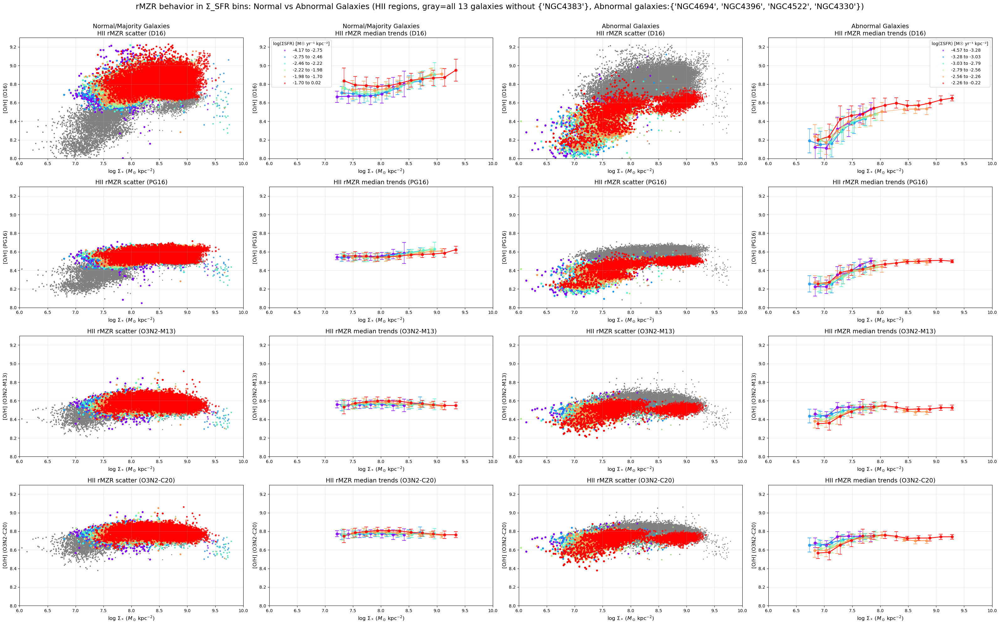


COMPLETED: Created combined plot with 4 rows × 4 columns
Columns 0-1: Normal galaxies (IC3392, NGC4064, NGC4192, NGC4293, NGC4298, NGC4419, NGC4457, NGC4501, NGC4698)
Columns 2-3: Abnormal galaxies (NGC4330, NGC4396, NGC4522, NGC4694)


In [6]:
# ------------------------------------------------------------------
# Individual Galaxy Analysis: rMZR behavior in Σ_SFR bins - HII regions only
# Dividing galaxies into 2 groups:
# - Normal/Majority group: The rest (columns 0-1)
# - Abnormal group: NGC4330, NGC4396, NGC4522, NGC4694 (columns 2-3)
# Single figure with 4 rows x 4 columns:
# - First 2 columns: Normal galaxies (scatter on col 0, median on col 1)
# - Last 2 columns: Abnormal galaxies (scatter on col 2, median on col 3)
# 4 rows: Each row shows 1 indicator
# 4 calibrations: D16, PG16, O3N2-M13, O3N2-C20
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from astropy.io import fits
import scipy.stats as stats

def load_maps_all_calibrations(gal):
    """Load all metallicity calibrations for HII regions"""
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # HII regions
        sigSFR_HII = h['LOGSFR_SURFACE_DENSITY_HII'].data
        oh_d16_HII = h['O_H_D16_HII'].data
        oh_pg16_HII = h['O_H_PG16_HII'].data
        oh_o3n2_m13_HII = h['O_H_O3N2_M13_HII'].data
        oh_o3n2_c20_HII = h['O_H_O3N2_C20_HII'].data
    return (sigM, sigSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, oh_o3n2_c20_HII)

def calculate_binned_stats(x_data, y_data, bin_width=0.2, min_pixels=20):
    """Calculate median and std in stellar mass bins - only keep bins with >= 20 unique datapoints"""
    # Define mass bins
    x_min, x_max = np.nanmin(x_data), np.nanmax(x_data)
    mass_bin_edges = np.arange(x_min, x_max + bin_width, bin_width)
    mass_bin_centers = (mass_bin_edges[:-1] + mass_bin_edges[1:]) / 2
    
    medians = []
    stds = []
    counts = []
    valid_centers = []
    valid_bin_indices = []
    
    for i, (bin_start, bin_end) in enumerate(zip(mass_bin_edges[:-1], mass_bin_edges[1:])):
        # Select data in this mass bin
        in_mass_bin = (x_data >= bin_start) & (x_data < bin_end)
        y_in_bin = y_data[in_mass_bin]
        
        if len(np.unique(y_in_bin)) >= min_pixels:
            medians.append(np.median(y_in_bin))
            stds.append(np.std(y_in_bin))
            counts.append(len(y_in_bin))
            valid_centers.append(mass_bin_centers[i])
            valid_bin_indices.append(i)
    
    return (np.array(valid_centers), np.array(medians), np.array(stds), 
            np.array(counts), np.array(valid_bin_indices))

# Get all galaxies
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]

# Galaxies to exclude entirely
excluded_galaxies = {'NGC4383'}

# Define galaxy groups
abnormal_galaxies = {'NGC4330', 'NGC4396', 'NGC4522', 'NGC4694'}
# Normal galaxies are all others (excluding NGC4383)

# ==============================================================================
# STEP 1: Collect combined data from all 13 galaxies (for gray background)
# ==============================================================================
print("="*80)
print("STEP 1: Collecting combined data from all 13 galaxies for background...")
print("="*80)

all_logSigmaM_HII = []
all_logSigmaSFR_HII = []
all_oh_d16_HII = []
all_oh_pg16_HII = []
all_oh_o3n2_m13_HII = []
all_oh_o3n2_c20_HII = []

normal_galaxies_list = []
abnormal_galaxies_list = []

print("\nCollecting data from all galaxies for HII regions...")
for gal in galaxies:
    if gal in excluded_galaxies:
        print(f"  {gal}: excluded from analysis")
        continue

    bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
    gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

    if bin_file.exists() and gas_file.exists():
        # Categorize galaxy
        if gal in abnormal_galaxies:
            abnormal_galaxies_list.append(gal)
        else:
            normal_galaxies_list.append(gal)
        
        # Load all data for HII regions
        (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
         oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

        # Find common spaxels for HII regions
        common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                           np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                           np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
        
        print(f"  {gal}: HII={np.sum(common_mask_HII)} pixels")
        
        # Append HII data
        all_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
        all_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
        all_oh_d16_HII.extend(oh_d16_HII[common_mask_HII].flatten())
        all_oh_pg16_HII.extend(oh_pg16_HII[common_mask_HII].flatten())
        all_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
        all_oh_o3n2_c20_HII.extend(oh_o3n2_c20_HII[common_mask_HII].flatten())
    else:
        print(f"  {gal}: Data files not found")

# Convert to numpy arrays
all_logSigmaM_HII = np.array(all_logSigmaM_HII)
all_logSigmaSFR_HII = np.array(all_logSigmaSFR_HII)
all_oh_d16_HII = np.array(all_oh_d16_HII)
all_oh_pg16_HII = np.array(all_oh_pg16_HII)
all_oh_o3n2_m13_HII = np.array(all_oh_o3n2_m13_HII)
all_oh_o3n2_c20_HII = np.array(all_oh_o3n2_c20_HII)

# Store combined data in a dictionary for easy access
combined_calib_map = {
    'oh_d16_HII': all_oh_d16_HII,
    'oh_pg16_HII': all_oh_pg16_HII,
    'oh_o3n2_m13_HII': all_oh_o3n2_m13_HII,
    'oh_o3n2_c20_HII': all_oh_o3n2_c20_HII
}

print(f"\nTotal combined pixels (HII): {len(all_logSigmaM_HII)}")
print(f"\nNormal galaxies ({len(normal_galaxies_list)}): {', '.join(sorted(normal_galaxies_list))}")
print(f"Abnormal galaxies ({len(abnormal_galaxies_list)}): {', '.join(sorted(abnormal_galaxies_list))}")

# ==============================================================================
# Define plotting parameters
# ==============================================================================
n_bins = 6

# Set uniform y-axis range
common_ylim = (8.0, 9.3)

print(f"\nUsing uniform y-axis range: {common_ylim[0]:.1f} to {common_ylim[1]:.1f}")

# Data for each calibration
calibrations = [
    ('oh_d16_HII', 'D16'),
    ('oh_pg16_HII', 'PG16'),
    ('oh_o3n2_m13_HII', 'O3N2-M13'),
    ('oh_o3n2_c20_HII', 'O3N2-C20')
]

# ==============================================================================
# STEP 2: Process both galaxy groups and store their data
# ==============================================================================
galaxy_groups = [
    (normal_galaxies_list, 'Normal/Majority Galaxies'),
    (abnormal_galaxies_list, 'Abnormal Galaxies')
]

# Store processed data for both groups
groups_data = []

for group_galaxies, group_name in galaxy_groups:
    print("\n" + "="*80)
    print(f"Processing {group_name}: {', '.join(sorted(group_galaxies))}")
    print("="*80)
    
    # ==============================================================================
    # Collect data for this galaxy group
    # ==============================================================================
    group_logSigmaM_HII = []
    group_logSigmaSFR_HII = []
    group_oh_d16_HII = []
    group_oh_pg16_HII = []
    group_oh_o3n2_m13_HII = []
    group_oh_o3n2_c20_HII = []
    
    for gal in group_galaxies:
        bin_file = Path(f'{gal}_SPATIAL_BINNING_maps_extended.fits')
        gas_file = Path(f'{gal}_gas_BIN_maps_extended.fits')

        if bin_file.exists() and gas_file.exists():
            # Load all data for this galaxy
            (logSigmaM, logSigmaSFR_HII, oh_d16_HII, oh_pg16_HII, oh_o3n2_m13_HII, 
             oh_o3n2_c20_HII) = load_maps_all_calibrations(gal)

            # Find common spaxels for HII regions
            common_mask_HII = (np.isfinite(logSigmaM) & np.isfinite(logSigmaSFR_HII) & 
                               np.isfinite(oh_d16_HII) & np.isfinite(oh_pg16_HII) & 
                               np.isfinite(oh_o3n2_m13_HII) & np.isfinite(oh_o3n2_c20_HII))
            
            # Append data
            group_logSigmaM_HII.extend(logSigmaM[common_mask_HII].flatten())
            group_logSigmaSFR_HII.extend(logSigmaSFR_HII[common_mask_HII].flatten())
            group_oh_d16_HII.extend(oh_d16_HII[common_mask_HII].flatten())
            group_oh_pg16_HII.extend(oh_pg16_HII[common_mask_HII].flatten())
            group_oh_o3n2_m13_HII.extend(oh_o3n2_m13_HII[common_mask_HII].flatten())
            group_oh_o3n2_c20_HII.extend(oh_o3n2_c20_HII[common_mask_HII].flatten())
    
    # Convert to numpy arrays
    group_logSigmaM_HII = np.array(group_logSigmaM_HII)
    group_logSigmaSFR_HII = np.array(group_logSigmaSFR_HII)
    group_oh_d16_HII = np.array(group_oh_d16_HII)
    group_oh_pg16_HII = np.array(group_oh_pg16_HII)
    group_oh_o3n2_m13_HII = np.array(group_oh_o3n2_m13_HII)
    group_oh_o3n2_c20_HII = np.array(group_oh_o3n2_c20_HII)
    
    # Map calibration variable names to actual data for this group
    group_calib_data_map = {
        'oh_d16_HII': group_oh_d16_HII,
        'oh_pg16_HII': group_oh_pg16_HII,
        'oh_o3n2_m13_HII': group_oh_o3n2_m13_HII,
        'oh_o3n2_c20_HII': group_oh_o3n2_c20_HII
    }
    
    print(f"\nTotal {group_name} pixels (HII): {len(group_logSigmaM_HII)}")
    
    # Calculate SFR bins for THIS GROUP based on its own data distribution
    percentiles = [0, 16.67, 33.33, 50, 66.67, 83.33, 100]
    group_sfr_bin_edges = np.percentile(group_logSigmaSFR_HII, percentiles)
    
    # Create bin labels with actual values for this group
    group_bin_labels = []
    for i in range(n_bins):
        group_bin_labels.append(f'{group_sfr_bin_edges[i]:.2f} to {group_sfr_bin_edges[i+1]:.2f}')
    
    print(f"\n{group_name} SFR bin edges (equal-count): {group_sfr_bin_edges}")
    for i, label in enumerate(group_bin_labels):
        print(f"  Bin {i+1}: {label}")
    
    # Verify bin counts for this group
    for i in range(n_bins):
        if i == 0:
            mask = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII < group_sfr_bin_edges[i+1])
        elif i == n_bins - 1:
            mask = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII <= group_sfr_bin_edges[i+1])
        else:
            mask = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII < group_sfr_bin_edges[i+1])
        print(f"    Bin {i+1} count: {np.sum(mask)}")
    
    # Store all group data
    groups_data.append({
        'name': group_name,
        'galaxies': group_galaxies,
        'logSigmaM_HII': group_logSigmaM_HII,
        'logSigmaSFR_HII': group_logSigmaSFR_HII,
        'calib_data_map': group_calib_data_map,
        'sfr_bin_edges': group_sfr_bin_edges,
        'bin_labels': group_bin_labels
    })

# ==============================================================================
# STEP 3: Create combined figure with 4 rows × 4 columns
# ==============================================================================
print("\n" + "="*80)
print("Creating combined figure with 4 rows × 4 columns...")
print("="*80)

# Colors for different bins
colors = plt.cm.rainbow(np.linspace(0, 1, n_bins))

# Create figure: 4 rows × 4 columns
fig, axes = plt.subplots(4, 4, figsize=(32, 20))

# Process each row (1 calibration per row)
for row_idx, (calib_key, calib_name) in enumerate(calibrations):
    print(f"\nProcessing {calib_name} calibration:")
    
    # Get combined data for this calibration (for gray background)
    combined_oh_data_HII = combined_calib_map[calib_key]
    
    # Process each group
    for group_idx, group_data in enumerate(groups_data):
        group_name = group_data['name']
        col_offset = group_idx * 2  # Normal: cols 0-1, Abnormal: cols 2-3
        
        print(f"  {group_name}:")
        
        # Get axes for this group
        ax_scatter = axes[row_idx, col_offset]
        ax_median = axes[row_idx, col_offset + 1]
        
        # Get data for this calibration and group
        group_oh_data_HII = group_data['calib_data_map'][calib_key]
        group_logSigmaM_HII = group_data['logSigmaM_HII']
        group_logSigmaSFR_HII = group_data['logSigmaSFR_HII']
        group_sfr_bin_edges = group_data['sfr_bin_edges']
        group_bin_labels = group_data['bin_labels']
        
        print(f"    {calib_name} range: {np.min(group_oh_data_HII):.3f} to {np.max(group_oh_data_HII):.3f}")
        
        # First, plot gray background (all 13 galaxies combined)
        ax_scatter.scatter(all_logSigmaM_HII, combined_oh_data_HII, c='gray', s=5, alpha=1.0, 
                          edgecolors='none', rasterized=True, label='All 13 galaxies')
        
        # Plot each Σ_SFR bin for this group
        valid_bins = 0
        legend_handles = []
        legend_labels = []
        
        for i in range(n_bins):
            # Process this SFR bin
            if i == 0:
                in_bin_HII = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII < group_sfr_bin_edges[i+1])
            elif i == n_bins - 1:
                in_bin_HII = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII <= group_sfr_bin_edges[i+1])
            else:
                in_bin_HII = (group_logSigmaSFR_HII >= group_sfr_bin_edges[i]) & (group_logSigmaSFR_HII < group_sfr_bin_edges[i+1])
            
            n_pixels_HII = np.sum(in_bin_HII)
            
            if n_pixels_HII >= 10:  # Process bins with enough pixels
                # Get data for this bin
                x_bin_HII = group_logSigmaM_HII[in_bin_HII]
                y_bin_HII = group_oh_data_HII[in_bin_HII]
                
                # Scatter plot
                scatter_hii = ax_scatter.scatter(x_bin_HII, y_bin_HII, c=[colors[i]], s=15, alpha=0.6, 
                                     edgecolors='none', rasterized=True)
                
                # Collect legend info only from first row
                if row_idx == 0:
                    legend_handles.append(scatter_hii)
                    legend_labels.append(group_bin_labels[i])
                
                # Median trends
                mass_centers_HII, medians_HII, stds_HII, counts_HII, valid_bin_indices_HII = calculate_binned_stats(
                    x_bin_HII, y_bin_HII, bin_width=0.2, min_pixels=20)
                
                if len(mass_centers_HII) > 0:
                    ax_median.errorbar(mass_centers_HII, medians_HII, yerr=stds_HII, 
                               color=colors[i], marker='o', markersize=6, 
                               linewidth=1, capsize=4, capthick=1.5, alpha=0.8)
                    
                    # Add lines between adjacent bins
                    for j in range(len(valid_bin_indices_HII) - 1):
                        current_bin_idx = valid_bin_indices_HII[j]
                        next_bin_idx = valid_bin_indices_HII[j + 1]
                        if next_bin_idx - current_bin_idx == 1:
                            ax_median.plot([mass_centers_HII[j], mass_centers_HII[j + 1]], 
                                   [medians_HII[j], medians_HII[j + 1]], 
                                   color=colors[i], linewidth=2, alpha=0.8)
                    valid_bins += 1
        
        # Format scatter plot
        ax_scatter.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        ax_scatter.set_ylabel(f'[O/H] ({calib_name})', fontsize=12)
        if row_idx == 0:
            ax_scatter.set_title(f'{group_name}\nHII rMZR scatter ({calib_name})', fontsize=14)
        else:
            ax_scatter.set_title(f'HII rMZR scatter ({calib_name})', fontsize=14)
        ax_scatter.grid(True, alpha=0.3)
        ax_scatter.set_xlim(6, 10)
        ax_scatter.set_ylim(common_ylim)
        
        # Format median trends plot
        ax_median.set_xlabel(r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', fontsize=12)
        ax_median.set_ylabel(f'[O/H] ({calib_name})', fontsize=12)
        if row_idx == 0:
            ax_median.set_title(f'{group_name}\nHII rMZR median trends ({calib_name})', fontsize=14)
        else:
            ax_median.set_title(f'HII rMZR median trends ({calib_name})', fontsize=14)
        ax_median.grid(True, alpha=0.3)
        ax_median.set_xlim(6, 10)
        ax_median.set_ylim(common_ylim)
        
        # Add legend only for first row
        if row_idx == 0 and len(legend_handles) > 0:
            ax_median.legend(legend_handles, legend_labels, loc='best', fontsize=10, framealpha=0.9, 
                           title='log(ΣSFR) [M☉ yr⁻¹ kpc⁻²]', title_fontsize=10)
        
        print(f"    Total valid bins: {valid_bins}")

# Add overall title and adjust layout
fig.suptitle(f'rMZR behavior in Σ_SFR bins: Normal vs Abnormal Galaxies (HII regions, gray=all 13 galaxies without {excluded_galaxies}, Abnormal galaxies:{abnormal_galaxies})', 
             fontsize=18, y=0.995)

plt.tight_layout(rect=[0, 0, 1, 0.99])  # Leave space for suptitle

# Save with appropriate filename
# plt.savefig('rMZR_HII_combined_4calibrations_4x4grid_6bins.png', dpi=300, bbox_inches='tight')
# plt.savefig('rMZR_HII_combined_4calibrations_4x4grid_6bins.pdf', bbox_inches='tight')
plt.show()

print("\n" + "="*80)
print("COMPLETED: Created combined plot with 4 rows × 4 columns")
print(f"Columns 0-1: Normal galaxies ({', '.join(sorted(normal_galaxies_list))})")
print(f"Columns 2-3: Abnormal galaxies ({', '.join(sorted(abnormal_galaxies_list))})")
print("="*80)